In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! git clone https://github.com/nipdep/HAR-ZSL-XAI.git --branch pd/PoseAE --single-branch
! mv /content/HAR-ZSL-XAI/src /content/

Cloning into 'HAR-ZSL-XAI'...
remote: Enumerating objects: 206, done.
remote: Counting objects: 100% (206/206), done.
remote: Compressing objects: 100% (117/117), done.
remote: Total 206 (delta 97), reused 189 (delta 87), pack-reused 0
Receiving objects: 100% (206/206), 64.85 MiB | 17.26 MiB/s, done.
Resolving deltas: 100% (97/97), done.


---

In [ ]:
data_root = '/content/drive/MyDrive/22_FYP42 - Zero-shot Explainable HAR/Datasets/Consolidated/UTD-MHAD'

In [ ]:
import os 
from datetime import date, datetime
from tqdm.autonotebook import tqdm
from copy import deepcopy
from collections import defaultdict
import numpy as np 
import numpy.random as random
import pandas as pd
import json
import pickle
from collections import defaultdict, OrderedDict

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss


from src.datasets.data import SUReader, UTDReader
# from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss
from src.utils.losses import *
from src.utils.analysis import action_evaluator

from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

# from src.running import train_step1, eval_step1

<ipython-input-4-cf0b8f069fbd>:3: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [ ]:
from sklearn.manifold import TSNE
# from umap import UMAP

import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px

In [ ]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "UTD-MHAD",
    "Model": "SOTAEmbedding",
    "model_params":{
        "linear_filters":[256,256,256,400],
        "input_feat": 12,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 50,
    "optimizer": "adam",
    "batch_size": 32,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [ ]:

def save_model(model,model_name,unique_name,fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH,exist_ok=True)
    torch.save({
        "n_epochs" : config["n_epochs"],
        "model_state_dict":model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")

model_iden = "fold"
notebook_iden = "SORTModel_feature"
models_saves = "model_saves"

In [ ]:
IMU_data_path = data_root+'/IMU/'
dataReader = SUReader(IMU_data_path)
actionList = dataReader.idToLabel

/content/src/datasets/data.py:1652: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(data), np.array(labels, dtype=int), np.array(subjects)


In [ ]:
def read_I3D_pkl(loc,feat_size="400"):
  if feat_size == "400":
    feat_index = 1
  elif feat_size == "2048":
    feat_index = 0
  else:
    raise NotImplementedError()

  with open(loc,"rb") as f0:
    __data = pickle.load(f0)

  label = []
  prototype = []
  for k,v in __data.items():
    label.append(k)
    all_arr = [x[feat_index] for x in v]
    all_arr = np.asarray(all_arr).mean(axis=0)
    prototype.append(all_arr)

  label = np.asarray(label)
  prototype = np.array(prototype)
  return {"activity":label, "features":prototype}

In [ ]:
# load video dataset
I3D_data_path  = data_root + '/I3D/video_feat.pkl'
video_data = read_I3D_pkl(I3D_data_path,feat_size="400")
video_classes, video_feat = video_data['activity'], video_data['features']

In [ ]:
label_map = {'a1': 'swipe left', 'a2': 'swipe right', 'a3': 'wave', 'a4': 'clap', 'a5': 'throw', 'a6': 'arm cross', 'a7': 'basketball shoot', 'a8': 'draw x', 'a9': 'draw circle(clockwise)', 'a10': 'draw circle(counter clockwise)', 'a11': 'draw triangle', 'a12': 'bowling', 'a13': 'boxing', 'a14': 'baseball swing', 'a15': 'tennis swing', 'a16': 'arm curl', 'a17': 'tennis serve', 'a18': 'push', 'a19': 'knock', 'a20': 'catch', 'a21': 'pickup & throw', 'a22': 'jog', 'a23': 'walk', 'a24': 'sit to stand', 'a25': 'stand to sit', 'a26': 'lunge', 'a27': 'squat',}
video_classes = [label_map[a] for a in video_classes]

In [ ]:
video_feat.shape

(27, 400)

In [ ]:
vid_cls_name = np.unique(video_classes)

In [ ]:
class PAMAP2Dataset(Dataset):
    def __init__(self, data, actions, attributes, attribute_dict, action_classes, seq_len=120):
        super(PAMAP2Dataset, self).__init__()
        self.data = torch.from_numpy(data)
        self.actions = actions
        self.attribute_dict = attribute_dict
        self.seq_len = seq_len
        self.attributes = torch.from_numpy(attributes)
        self.action_classes = action_classes
        # build action to id mapping dict
        self.n_action = len(self.actions)
        self.action2Id = dict(zip(action_classes, range(self.n_action)))

    def __getitem__(self, ind):
        x = self.data[ind, ...]
        target = self.actions[ind]
        y = torch.from_numpy(np.array([self.action2Id[target]]))
        # extraction semantic space generation skeleton sequences
        vid_idx = random.choice(self.attribute_dict[target])
        y_feat = self.attributes[vid_idx, ...]
        return x, y, y_feat

    def __len__(self):
        return self.data.shape[0]

    def getClassAttrs(self):
        sampling_idx = [random.choice(self.attribute_dict[i]) for i in self.action_classes]
        ft_mat = self.attributes[sampling_idx, ...]
        return ft_mat

    def getClassFeatures(self):
        cls_feat = []
        for c in self.action_classes:
            idx = self.attribute_dict[c]
            cls_feat.append(torch.mean(self.attributes[idx, ...], dim=0))

        cls_feat = torch.vstack(cls_feat)
        # print(cls_feat.size())
        return cls_feat

In [ ]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=36, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [ ]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

emb = model(torch.randn((32,12)))
emb.size()

torch.Size([32, 400])

---

In [ ]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
fold_classes = [['swipe left', 'arm cross', 'draw triangle', 'arm curl', 'jog', 'pickup & throw'], ['swipe right', 'basketball shoot', 'bowling', 'tennis serve', 'walk', 'squat'], ['wave', 'draw x', 'boxing', 'push', 'sit to stand'], ['clap', 'draw circle(clockwise)', 'baseball swing', 'knock', 'stand to sit'], ['throw', 'draw circle(counter clockwise)', 'tennis swing', 'catch', 'lunge']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [ ]:
dataReader.label_map

[(1, 'swipe left'),
 (2, 'swipe right'),
 (3, 'wave'),
 (4, 'clap'),
 (5, 'throw'),
 (6, 'arm cross'),
 (7, 'basketball shoot'),
 (8, 'draw x'),
 (9, 'draw circle(clockwise)'),
 (10, 'draw circle(counter clockwise)'),
 (11, 'draw triangle'),
 (12, 'bowling'),
 (13, 'boxing'),
 (14, 'baseball swing'),
 (15, 'tennis swing'),
 (16, 'arm curl'),
 (17, 'tennis serve'),
 (18, 'push'),
 (19, 'knock'),
 (20, 'catch'),
 (21, 'pickup & throw'),
 (22, 'jog'),
 (23, 'walk'),
 (24, 'sit to stand'),
 (25, 'stand to sit'),
 (26, 'lunge'),
 (27, 'squat')]

In [ ]:
label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [ ]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=1.2, window_overlap=1.0, resample_freq=50)

data shape : (861,), seen_data shape : (669,)
{'swipe left': 32, 'swipe right': 32, 'wave': 32, 'clap': 32, 'throw': 32, 'arm cross': 32, 'basketball shoot': 32, 'draw x': 31, 'draw circle(clockwise)': 32, 'draw circle(counter clockwise)': 32, 'draw triangle': 32, 'bowling': 32, 'boxing': 32, 'baseball swing': 32, 'tennis swing': 32, 'arm curl': 32, 'tennis serve': 32, 'push': 32, 'knock': 32, 'catch': 32, 'pickup & throw': 32, 'jog': 32, 'walk': 31, 'sit to stand': 32, 'stand to sit': 32, 'lunge': 32, 'squat': 31}
(7668, 12)


In [ ]:
data_dict['train']['X'].shape,data_dict['eval-seen']['X'].shape,data_dict["test"]["X"].shape

((6134, 12), (1534, 12), (2246, 12))

In [ ]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="mean")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    # print("selected featues > ", selected_features.shape, "y_pred > ", y_pred.shape)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [ ]:
def train_step(model, dataloader, dataset:PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train', l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [ ]:
def eval_step(model, dataloader,dataset, loss_module, device, class_names,  phase='seen', l2_reg=False, print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}
    metrics = {"samples": 0, "loss": 0, "feat. loss": 0, "classi. loss": 0}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])
            
            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            with torch.no_grad():
                metrics['samples'] += len(targets)
                metrics['loss'] += loss.item()  # add total loss of batch
                metrics['feat. loss'] += feat_loss.item()
                metrics['classi. loss'] += class_loss.item()

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    metrics_dict.update(metrics)
    return metrics_dict

In [ ]:
def plot_curves(df):
    df['loss'] = df['loss']/df['samples']
    df['feat. loss'] = df['feat. loss']/df['samples']
    df['classi. loss'] = df['classi. loss']/df['samples']
    
    fig, axs = plt.subplots(nrows=4)
    sns.lineplot(data=df, x='epoch', y='loss', hue='phase', marker='o', ax=axs[2]).set(title="Loss")
    sns.lineplot(data=df, x='epoch', y='feat. loss', hue='phase', marker='o', ax=axs[0]).set(title="Feature Loss")
    sns.lineplot(data=df, x='epoch', y='classi. loss', hue='phase', marker='o', ax=axs[1]).set(title="Classification Loss")
    sns.lineplot(data=df, x='epoch', y='accuracy', hue='phase', marker='o', ax=axs[3]).set(title="Accuracy")

In [ ]:
def plot_curves(df):
    df['loss'] = df['loss']/df['samples']
    df['feat. loss'] = df['feat. loss']/df['samples']
    df['classi. loss'] = df['classi. loss']/df['samples']
    
    fig, axs = plt.subplots(nrows=4)
    sns.lineplot(data=df, x='epoch', y='loss', hue='phase', marker='o', ax=axs[2]).set(title="Loss")
    sns.lineplot(data=df, x='epoch', y='feat. loss', hue='phase', marker='o', ax=axs[0]).set(title="Feature Loss")
    sns.lineplot(data=df, x='epoch', y='classi. loss', hue='phase', marker='o', ax=axs[1]).set(title="Classification Loss")
    sns.lineplot(data=df, x='epoch', y='accuracy', hue='phase', marker='o', ax=axs[3]).set(title="Accuracy")

================ Fold-0 ================
Unseen Classes : ['swipe left', 'arm cross', 'draw triangle', 'arm curl', 'jog', 'pickup & throw']
data shape : (861,), seen_data shape : (669,)
{'swipe left': 32, 'swipe right': 32, 'wave': 32, 'clap': 32, 'throw': 32, 'arm cross': 32, 'basketball shoot': 32, 'draw x': 31, 'draw circle(clockwise)': 32, 'draw circle(counter clockwise)': 32, 'draw triangle': 32, 'bowling': 32, 'boxing': 32, 'baseball swing': 32, 'tennis swing': 32, 'arm curl': 32, 'tennis serve': 32, 'push': 32, 'knock': 32, 'catch': 32, 'pickup & throw': 32, 'jog': 32, 'walk': 31, 'sit to stand': 32, 'stand to sit': 32, 'lunge': 32, 'squat': 31}
(7668, 12)
seen classes >  [1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 22, 23, 24, 25, 26]
unseen classes >  [0, 5, 10, 15, 21, 20]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

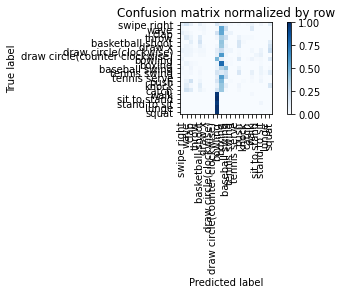

Overall accuracy: 0.107



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

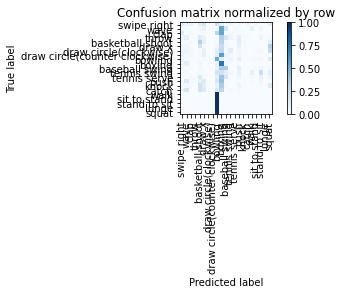

Overall accuracy: 0.106



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

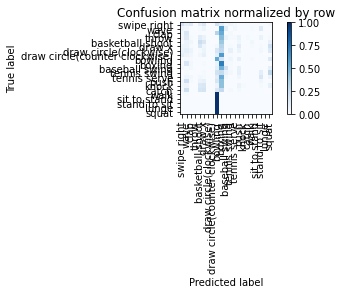

Overall accuracy: 0.098



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

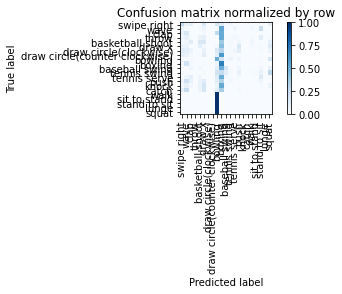

Overall accuracy: 0.091



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

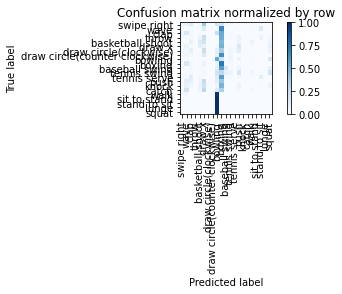

Overall accuracy: 0.088



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

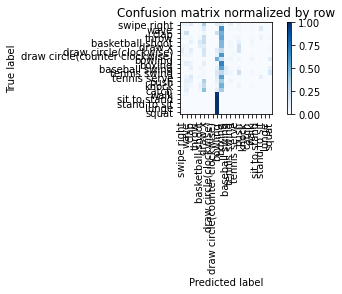

Overall accuracy: 0.085



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

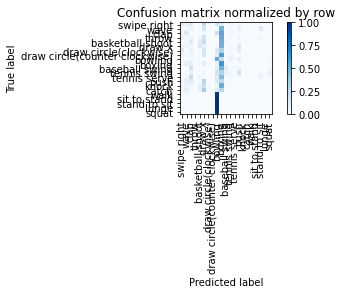

Overall accuracy: 0.082



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

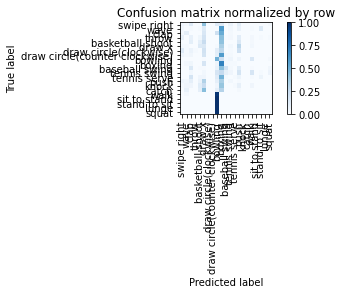

Overall accuracy: 0.089



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

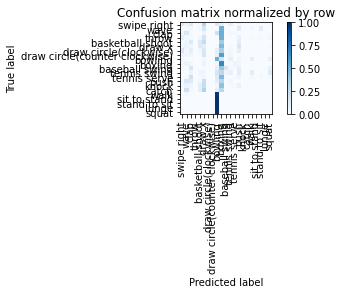

Overall accuracy: 0.091



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

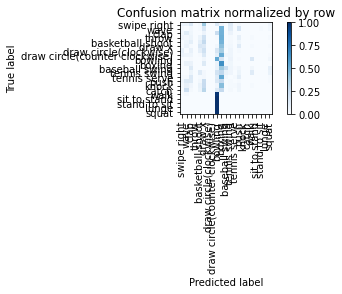

Overall accuracy: 0.092



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

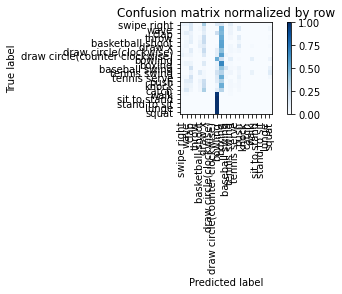

Overall accuracy: 0.088



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

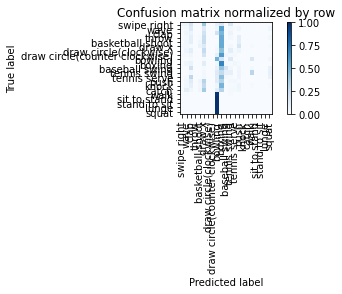

Overall accuracy: 0.088



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

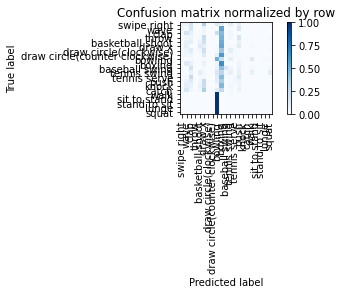

Overall accuracy: 0.089



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

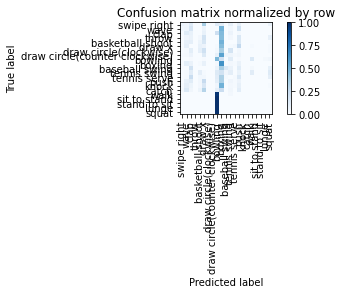

Overall accuracy: 0.085



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

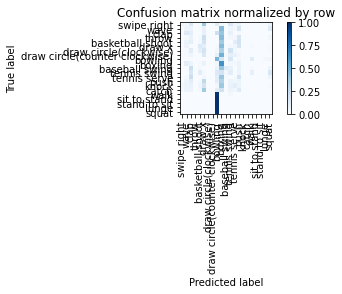

Overall accuracy: 0.085



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

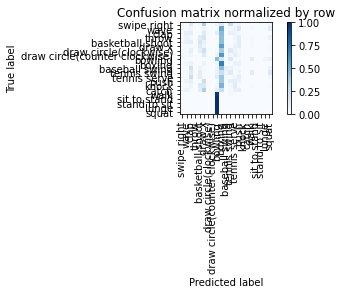

Overall accuracy: 0.089



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

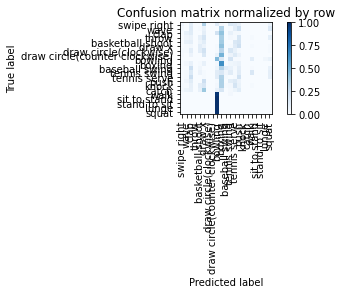

Overall accuracy: 0.084



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

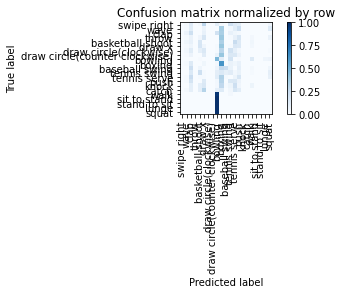

Overall accuracy: 0.096



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

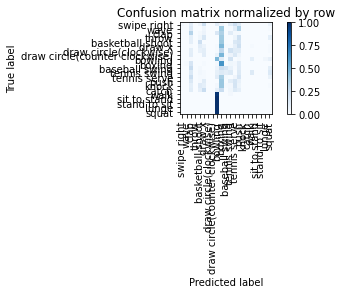

Overall accuracy: 0.102



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

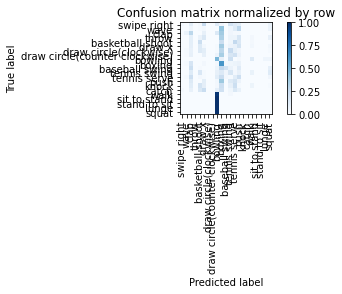

Overall accuracy: 0.104



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

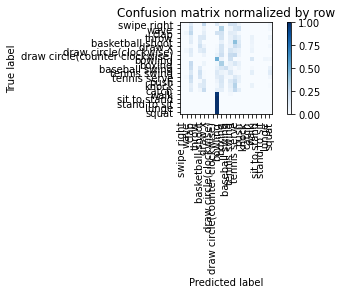

Overall accuracy: 0.092



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

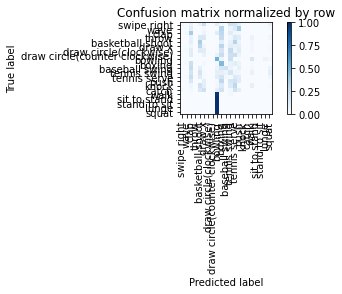

Overall accuracy: 0.111



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

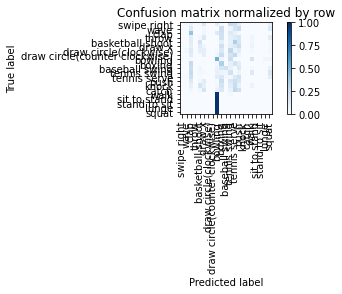

Overall accuracy: 0.102



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

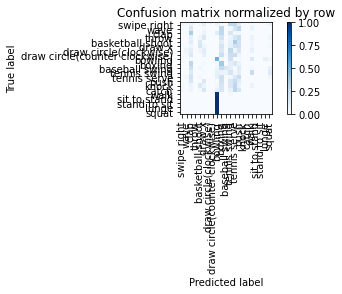

Overall accuracy: 0.097



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

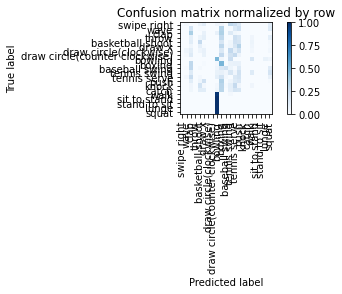

Overall accuracy: 0.106



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

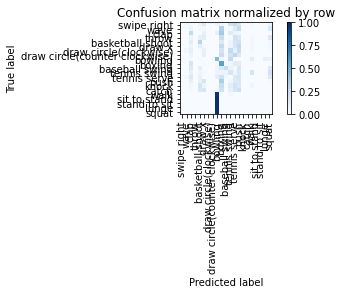

Overall accuracy: 0.111



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

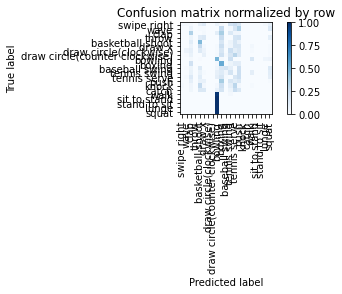

Overall accuracy: 0.116



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

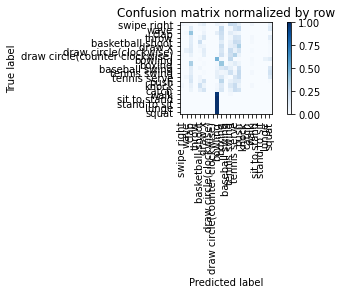

Overall accuracy: 0.108



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

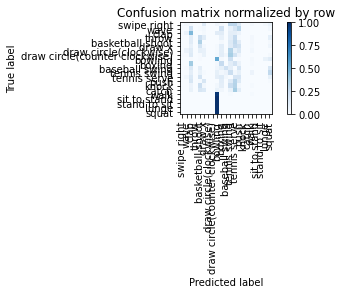

Overall accuracy: 0.109



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

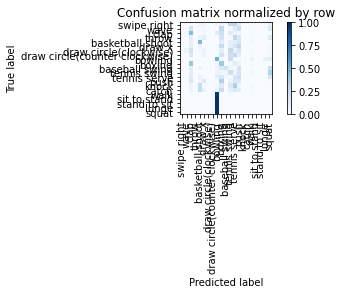

Overall accuracy: 0.116



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

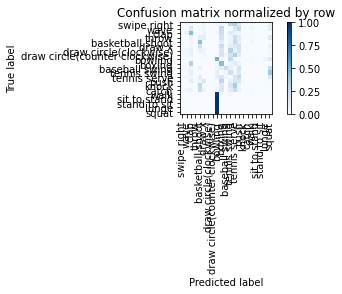

Overall accuracy: 0.119



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

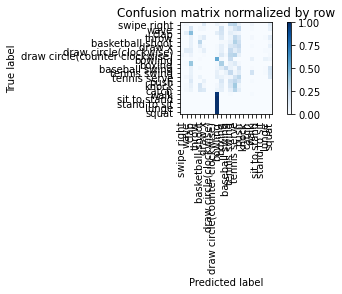

Overall accuracy: 0.119



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

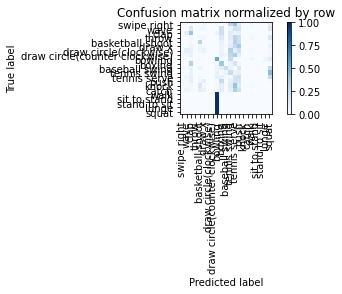

Overall accuracy: 0.118



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

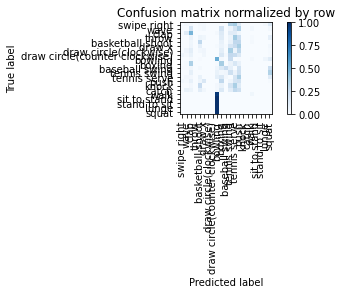

Overall accuracy: 0.116



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

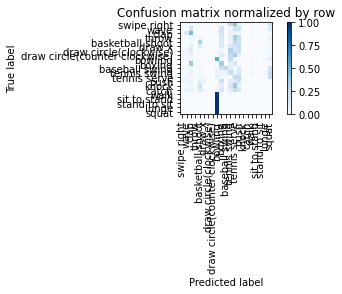

Overall accuracy: 0.126



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

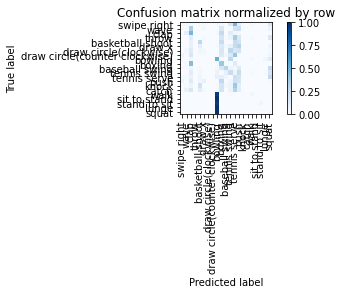

Overall accuracy: 0.126



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

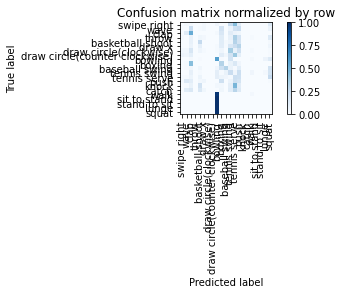

Overall accuracy: 0.126



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

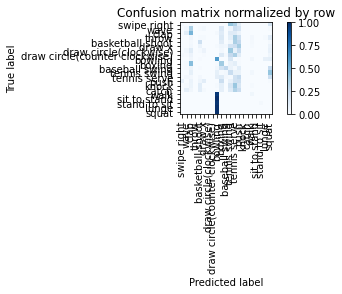

Overall accuracy: 0.128



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

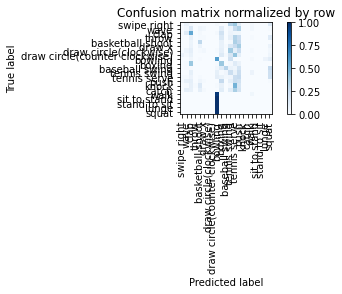

Overall accuracy: 0.132



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

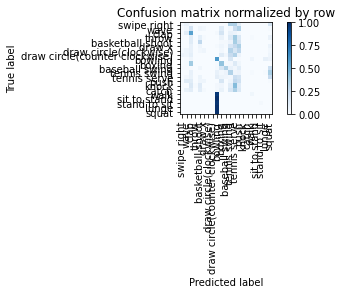

Overall accuracy: 0.144



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

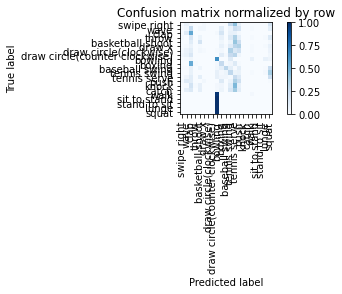

Overall accuracy: 0.128



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

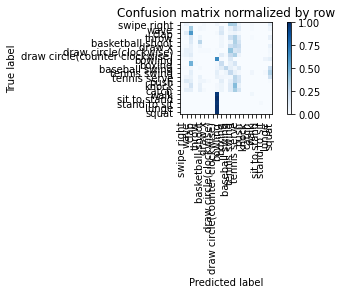

Overall accuracy: 0.137



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

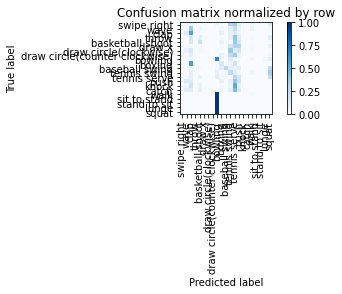

Overall accuracy: 0.130



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

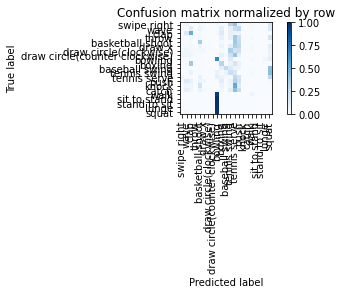

Overall accuracy: 0.136



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

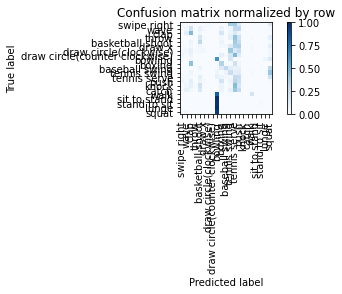

Overall accuracy: 0.139



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

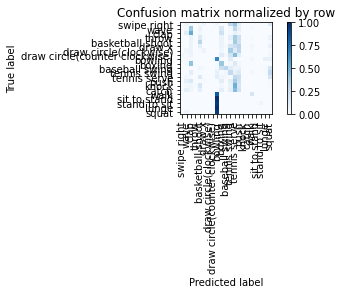

Overall accuracy: 0.149



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

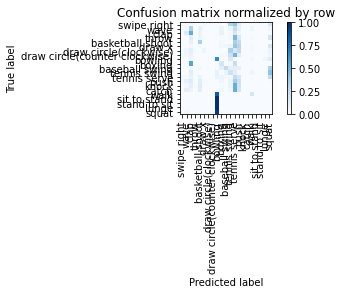

Overall accuracy: 0.136



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

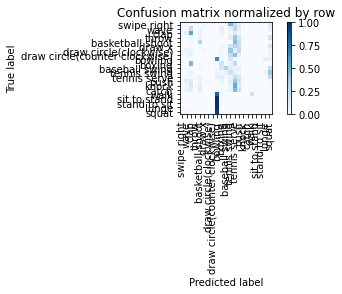

Overall accuracy: 0.139



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

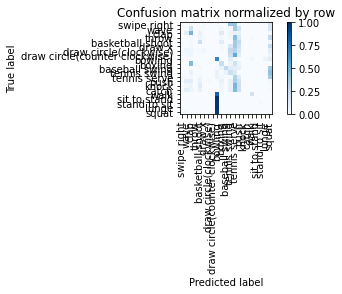

Overall accuracy: 0.140



train:   0%|          | 0/191 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

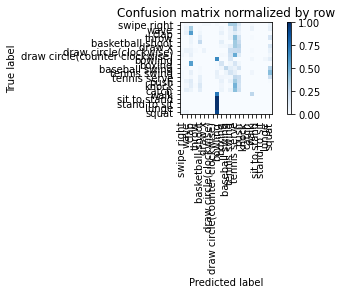

Overall accuracy: 0.140



unseen:   0%|          | 0/70 [00:00<?, ?batch/s]

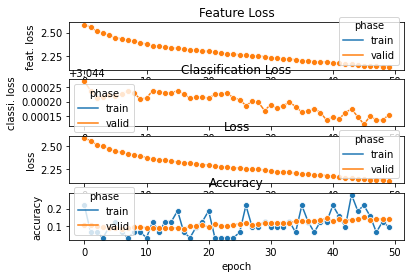

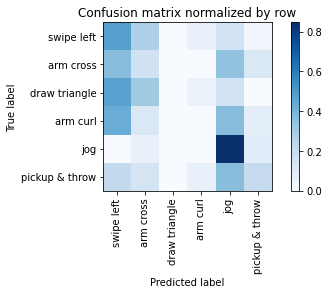

Overall accuracy: 0.269

{'accuracy': 0.26919642857142856, 'precision': 0.20071935716031405, 'recall': 0.28301079023117587, 'f1': 0.2047946494545095, 'samples': 2240, 'loss': 4617.1201171875, 'feat. loss': 4616.718841552734, 'classi. loss': 4013.23104095459}
================ Fold-1 ================
Unseen Classes : ['swipe right', 'basketball shoot', 'bowling', 'tennis serve', 'walk', 'squat']
data shape : (861,), seen_data shape : (671,)
{'swipe left': 32, 'swipe right': 32, 'wave': 32, 'clap': 32, 'throw': 32, 'arm cross': 32, 'basketball shoot': 32, 'draw x': 31, 'draw circle(clockwise)': 32, 'draw circle(counter clockwise)': 32, 'draw triangle': 32, 'bowling': 32, 'boxing': 32, 'baseball swing': 32, 'tennis swing': 32, 'arm curl': 32, 'tennis serve': 32, 'push': 32, 'knock': 32, 'catch': 32, 'pickup & throw': 32, 'jog': 32, 'walk': 31, 'sit to stand': 32, 'stand to sit': 32, 'lunge': 32, 'squat': 31}
(7574, 12)
seen classes >  [0, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19

Training Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

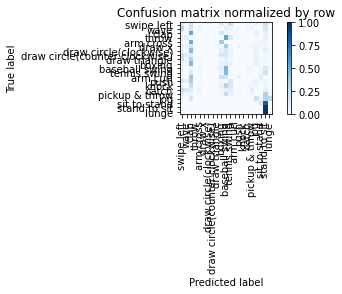

Overall accuracy: 0.127



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

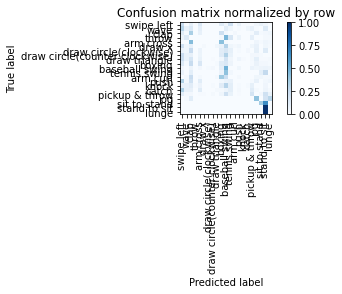

Overall accuracy: 0.150



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

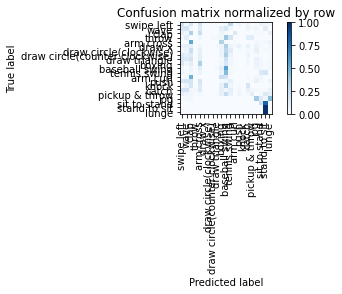

Overall accuracy: 0.141



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

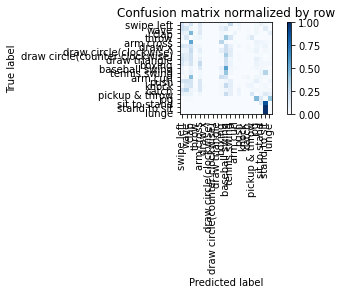

Overall accuracy: 0.150



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

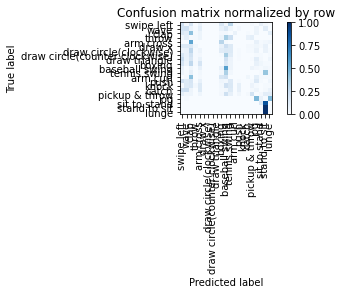

Overall accuracy: 0.152



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

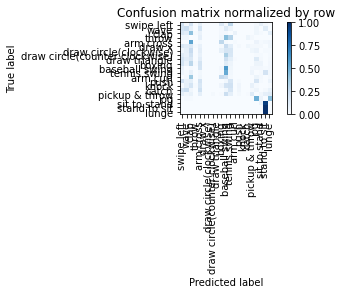

Overall accuracy: 0.148



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

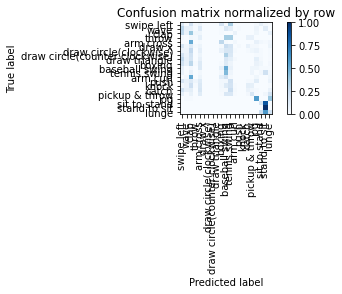

Overall accuracy: 0.158



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

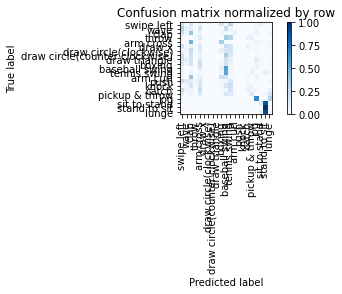

Overall accuracy: 0.160



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

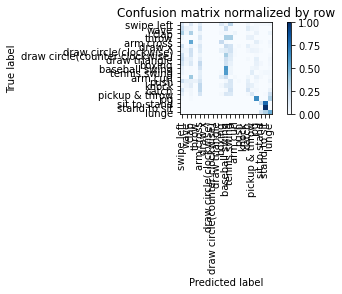

Overall accuracy: 0.190



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

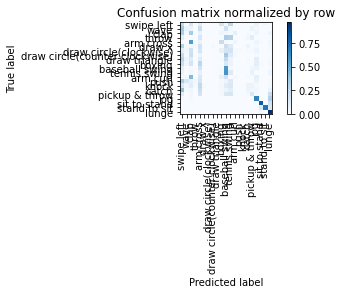

Overall accuracy: 0.225



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

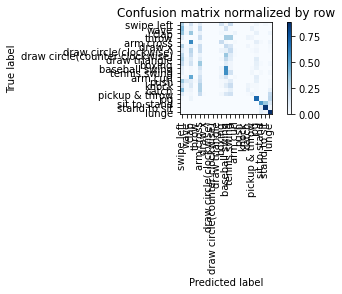

Overall accuracy: 0.215



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

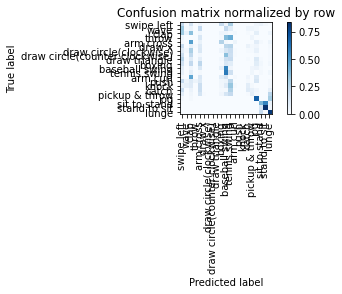

Overall accuracy: 0.203



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

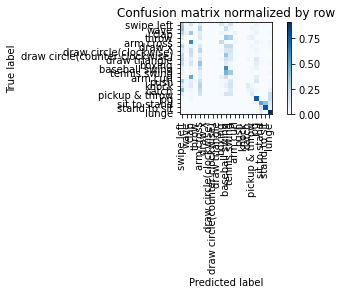

Overall accuracy: 0.226



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

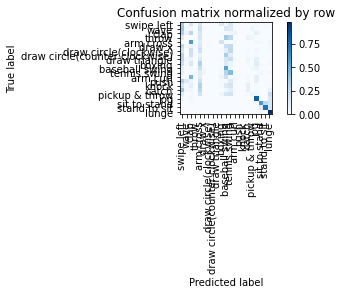

Overall accuracy: 0.233



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

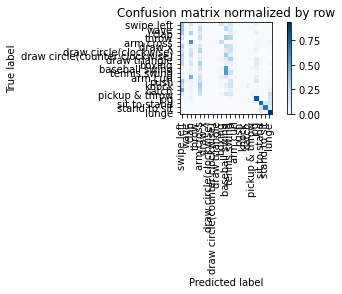

Overall accuracy: 0.218



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

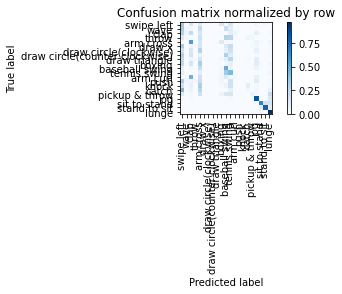

Overall accuracy: 0.237



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

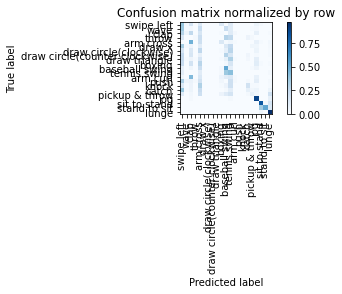

Overall accuracy: 0.241



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

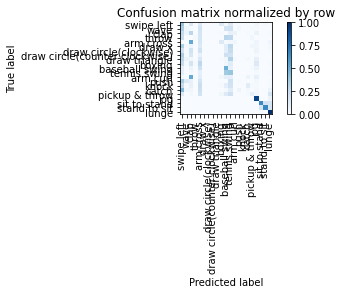

Overall accuracy: 0.240



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

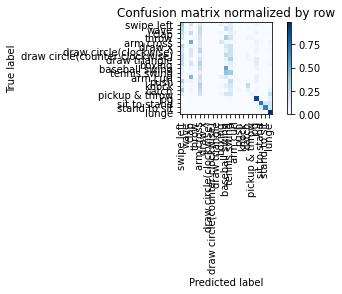

Overall accuracy: 0.241



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

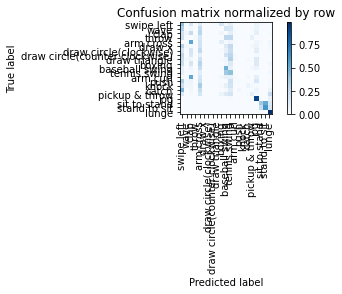

Overall accuracy: 0.223



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

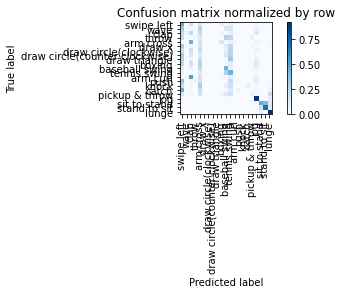

Overall accuracy: 0.230



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

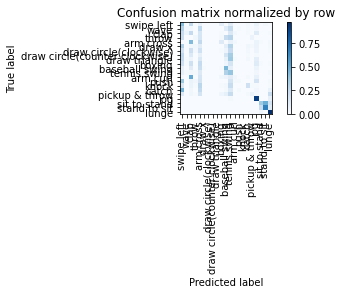

Overall accuracy: 0.226



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

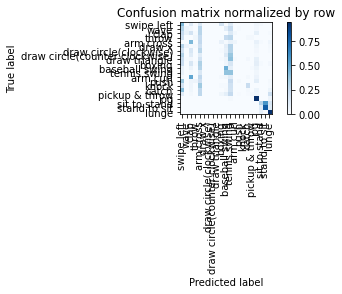

Overall accuracy: 0.222



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

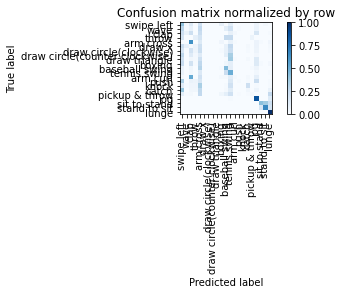

Overall accuracy: 0.226



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

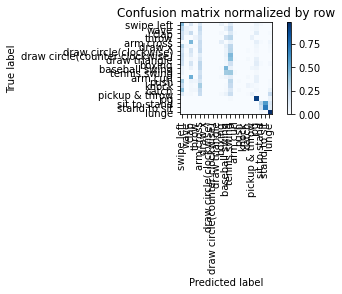

Overall accuracy: 0.227



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

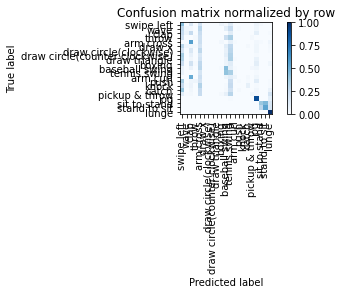

Overall accuracy: 0.219



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

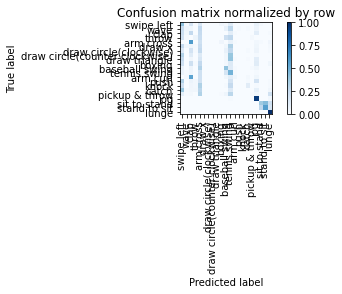

Overall accuracy: 0.225



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

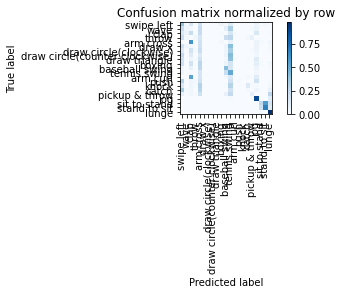

Overall accuracy: 0.225



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

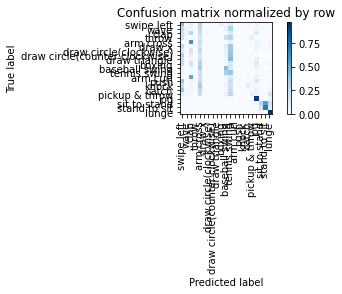

Overall accuracy: 0.225



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

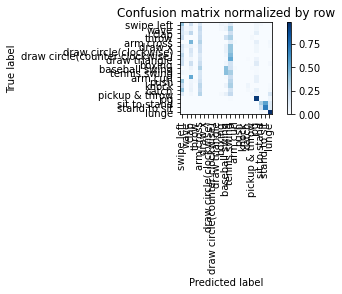

Overall accuracy: 0.221



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

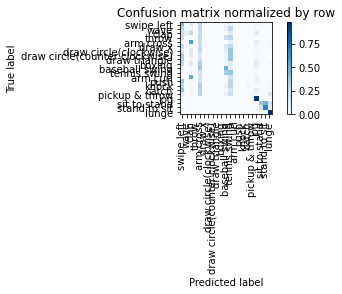

Overall accuracy: 0.229



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

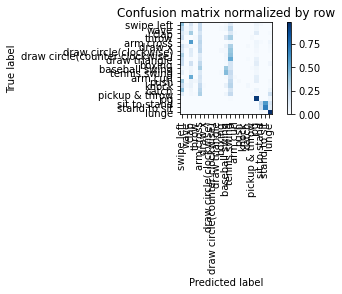

Overall accuracy: 0.219



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

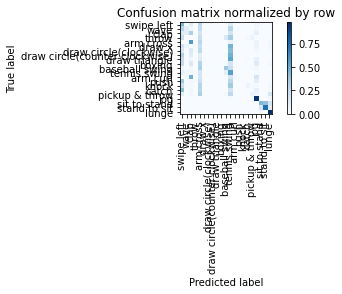

Overall accuracy: 0.245



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

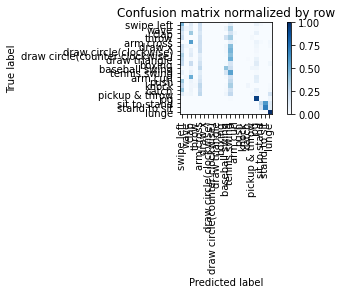

Overall accuracy: 0.237



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

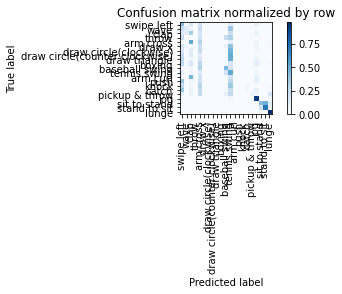

Overall accuracy: 0.249



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

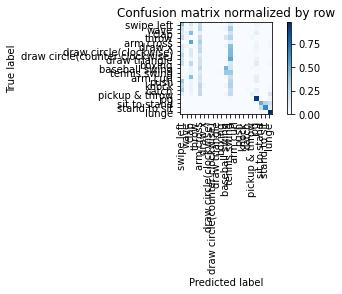

Overall accuracy: 0.244



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

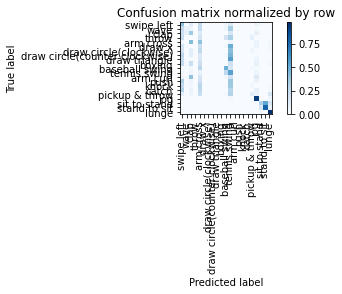

Overall accuracy: 0.255



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

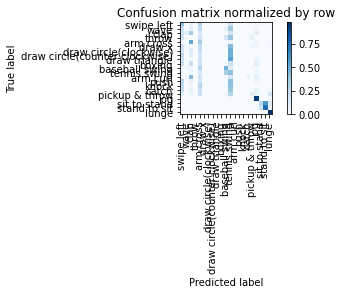

Overall accuracy: 0.240



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

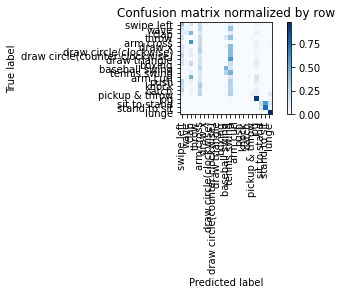

Overall accuracy: 0.243



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

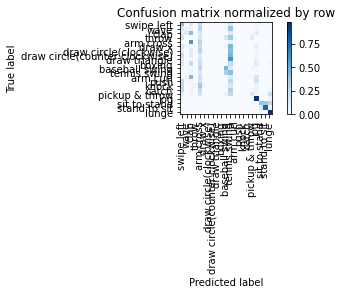

Overall accuracy: 0.251



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

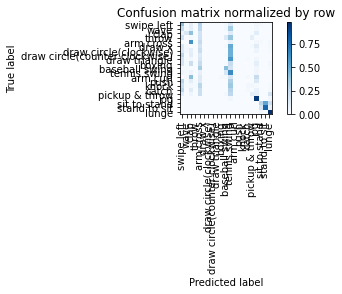

Overall accuracy: 0.245



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

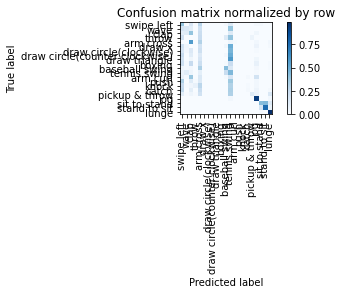

Overall accuracy: 0.256



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

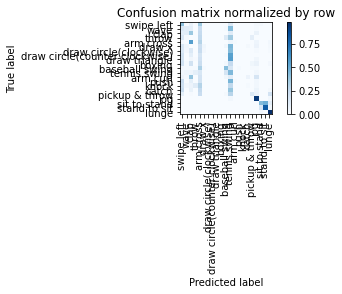

Overall accuracy: 0.254



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

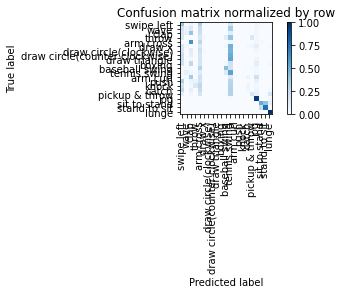

Overall accuracy: 0.261



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

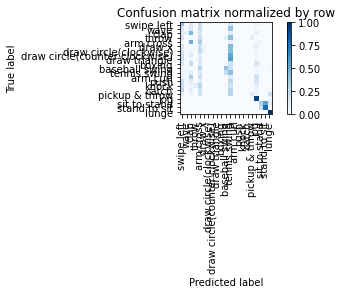

Overall accuracy: 0.250



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

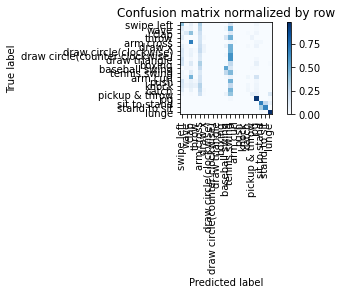

Overall accuracy: 0.255



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

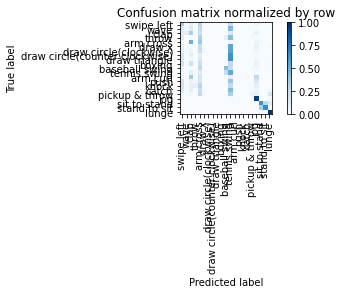

Overall accuracy: 0.251



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

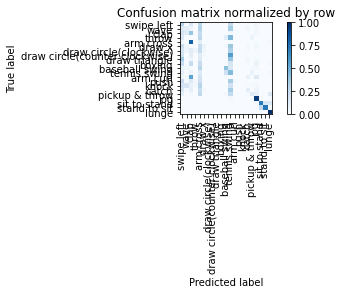

Overall accuracy: 0.251



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

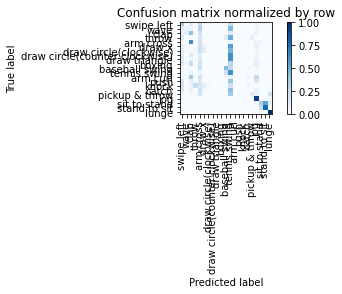

Overall accuracy: 0.255



train:   0%|          | 0/189 [00:00<?, ?batch/s]

seen:   0%|          | 0/47 [00:00<?, ?batch/s]

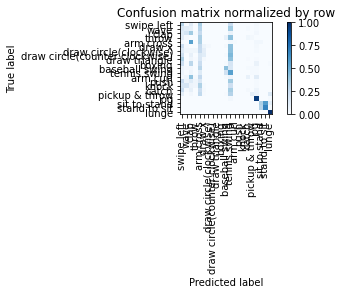

Overall accuracy: 0.248



unseen:   0%|          | 0/73 [00:00<?, ?batch/s]

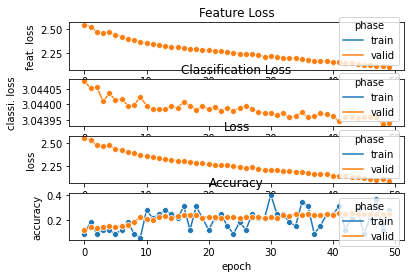

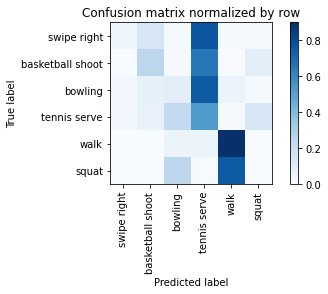

Overall accuracy: 0.301

{'accuracy': 0.3009417808219178, 'precision': 0.27571719393942334, 'recall': 0.30046465067655864, 'f1': 0.23778309505767825, 'samples': 2336, 'loss': 5148.646095275879, 'feat. loss': 5148.227828979492, 'classi. loss': 4184.395092010498}
================ Fold-2 ================
Unseen Classes : ['wave', 'draw x', 'boxing', 'push', 'sit to stand']
data shape : (861,), seen_data shape : (702,)
{'swipe left': 32, 'swipe right': 32, 'wave': 32, 'clap': 32, 'throw': 32, 'arm cross': 32, 'basketball shoot': 32, 'draw x': 31, 'draw circle(clockwise)': 32, 'draw circle(counter clockwise)': 32, 'draw triangle': 32, 'bowling': 32, 'boxing': 32, 'baseball swing': 32, 'tennis swing': 32, 'arm curl': 32, 'tennis serve': 32, 'push': 32, 'knock': 32, 'catch': 32, 'pickup & throw': 32, 'jog': 32, 'walk': 31, 'sit to stand': 32, 'stand to sit': 32, 'lunge': 32, 'squat': 31}
(8294, 12)
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26

Training Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

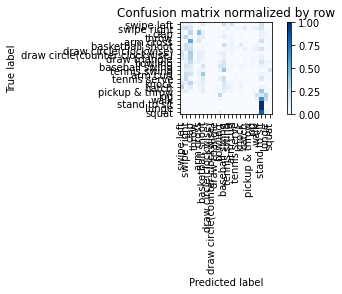

Overall accuracy: 0.081



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

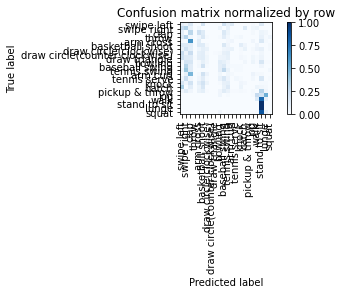

Overall accuracy: 0.098



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

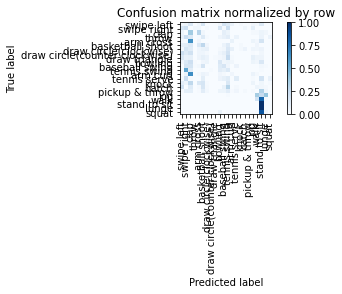

Overall accuracy: 0.111



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

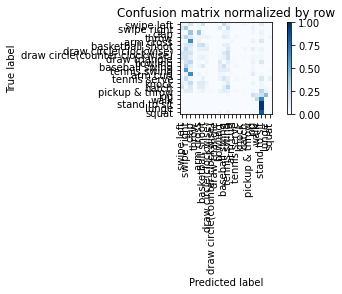

Overall accuracy: 0.124



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

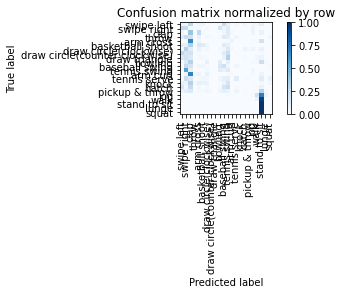

Overall accuracy: 0.097



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

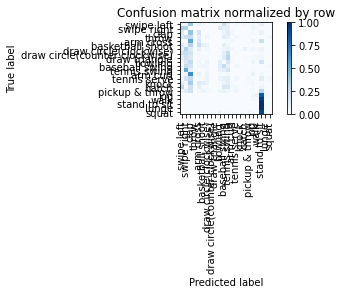

Overall accuracy: 0.100



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

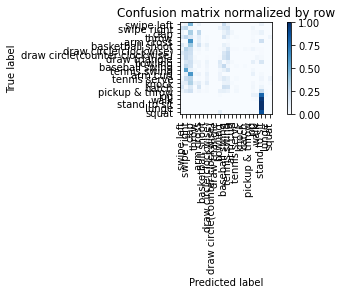

Overall accuracy: 0.098



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

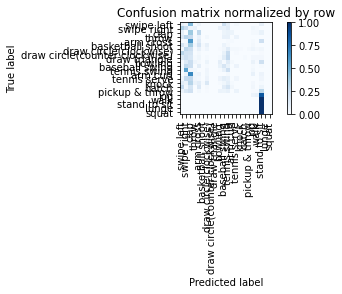

Overall accuracy: 0.094



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

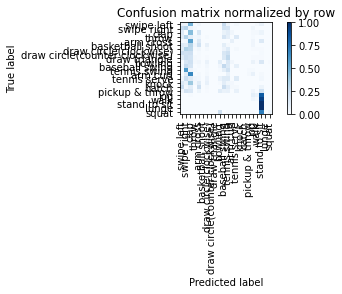

Overall accuracy: 0.112



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

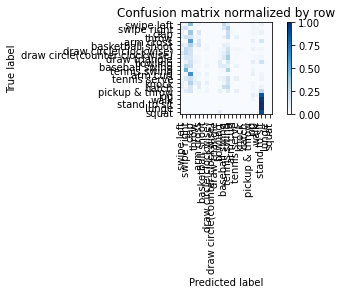

Overall accuracy: 0.101



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

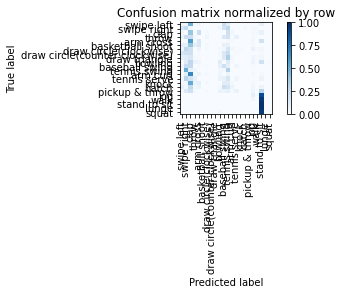

Overall accuracy: 0.105



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

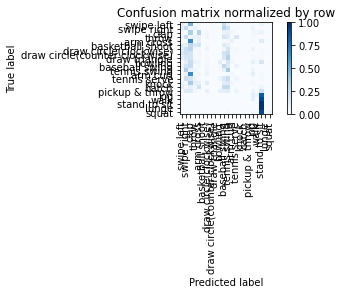

Overall accuracy: 0.112



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

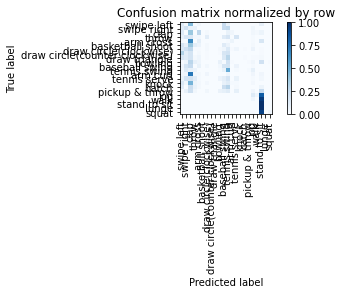

Overall accuracy: 0.111



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

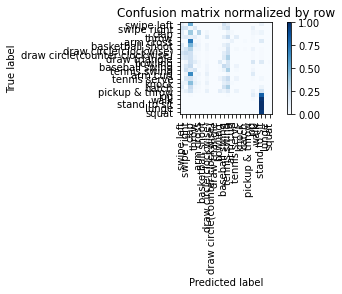

Overall accuracy: 0.107



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

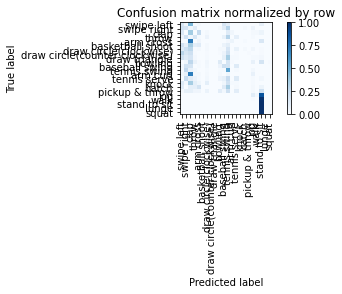

Overall accuracy: 0.119



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

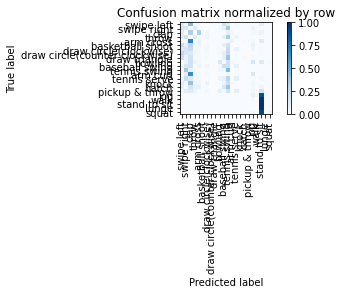

Overall accuracy: 0.113



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

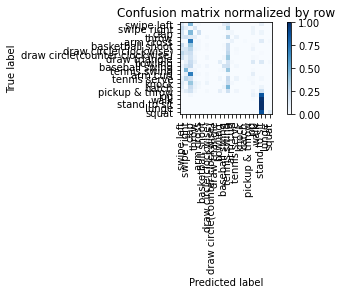

Overall accuracy: 0.110



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

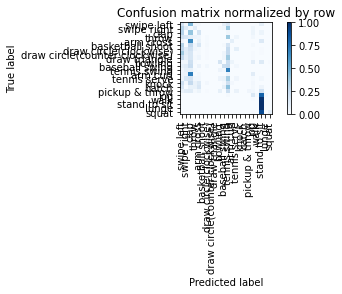

Overall accuracy: 0.131



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

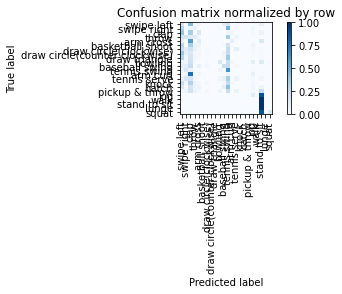

Overall accuracy: 0.125



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

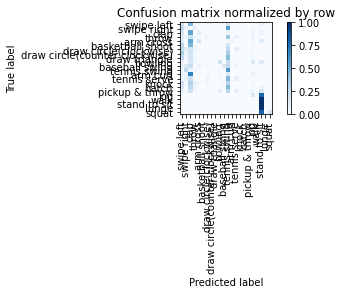

Overall accuracy: 0.138



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

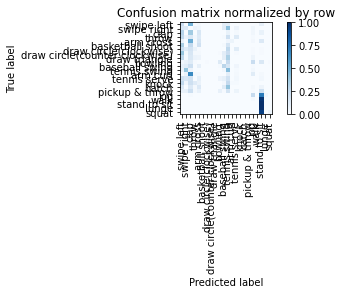

Overall accuracy: 0.123



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

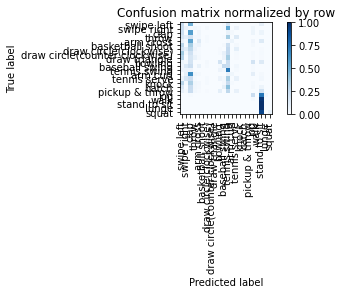

Overall accuracy: 0.143



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

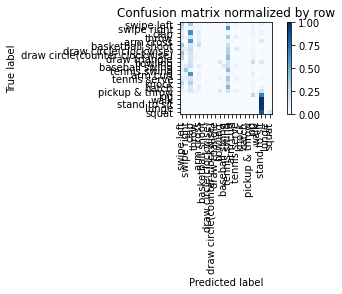

Overall accuracy: 0.132



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

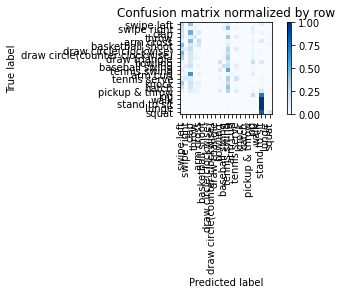

Overall accuracy: 0.152



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

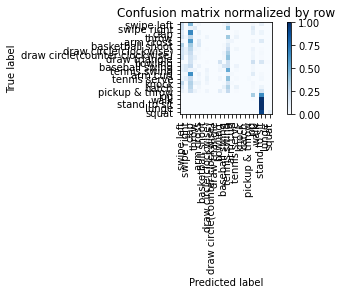

Overall accuracy: 0.136



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

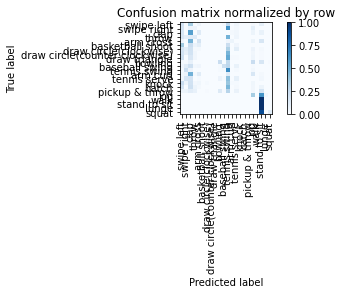

Overall accuracy: 0.150



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

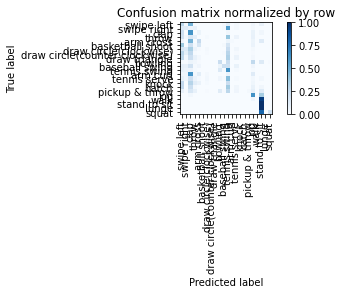

Overall accuracy: 0.175



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

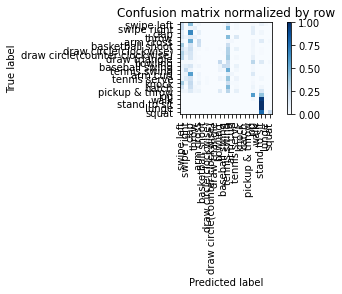

Overall accuracy: 0.169



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

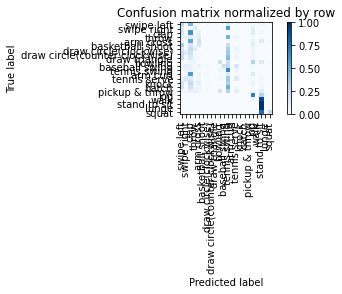

Overall accuracy: 0.179



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

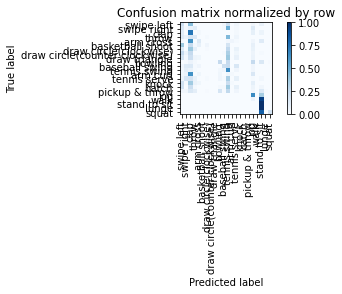

Overall accuracy: 0.176



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

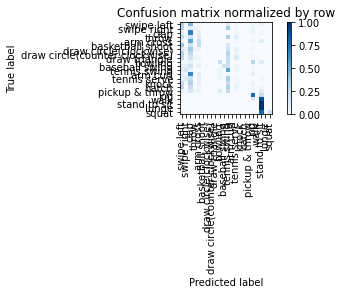

Overall accuracy: 0.176



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

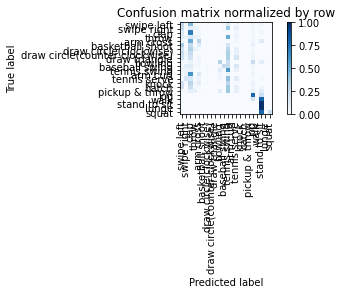

Overall accuracy: 0.191



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

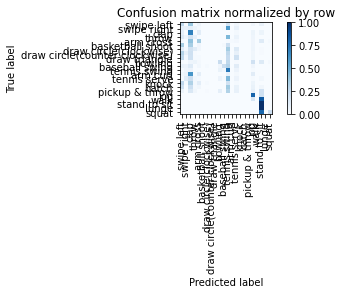

Overall accuracy: 0.194



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

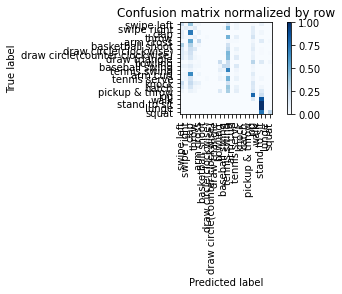

Overall accuracy: 0.194



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

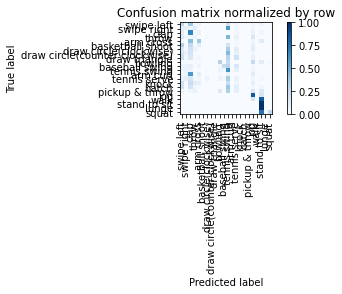

Overall accuracy: 0.200



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

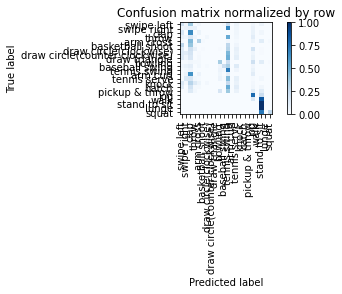

Overall accuracy: 0.195



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

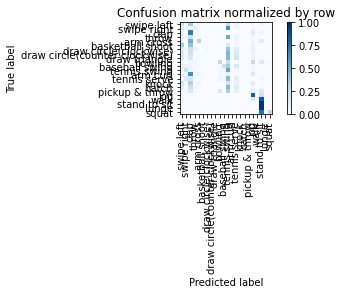

Overall accuracy: 0.186



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

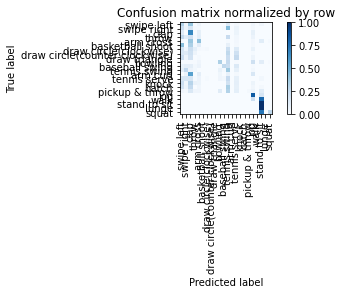

Overall accuracy: 0.196



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

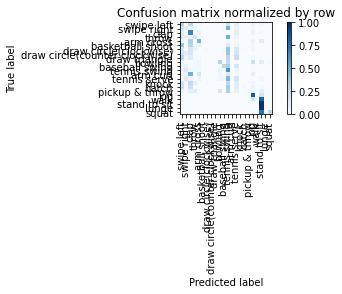

Overall accuracy: 0.220



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

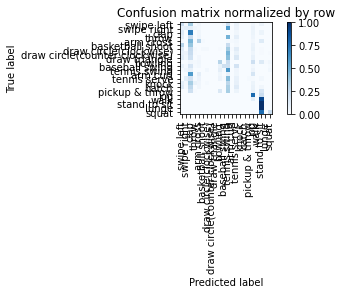

Overall accuracy: 0.188



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

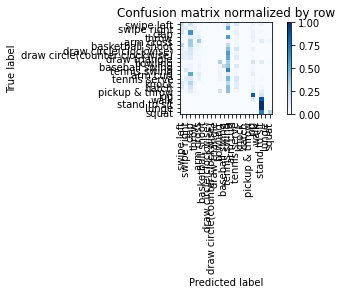

Overall accuracy: 0.207



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

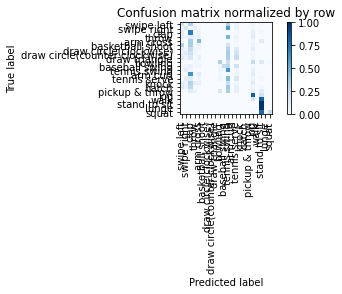

Overall accuracy: 0.203



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

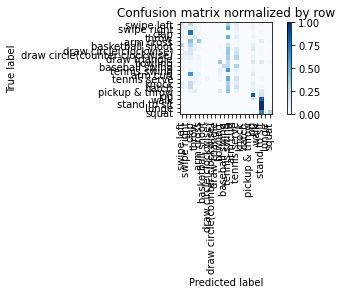

Overall accuracy: 0.216



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

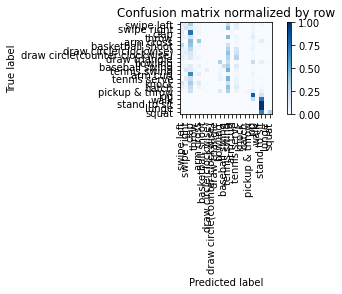

Overall accuracy: 0.195



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

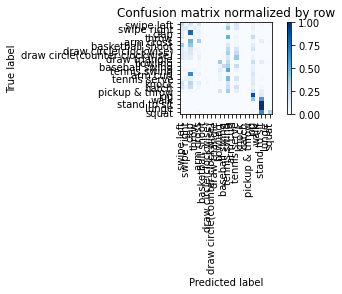

Overall accuracy: 0.211



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

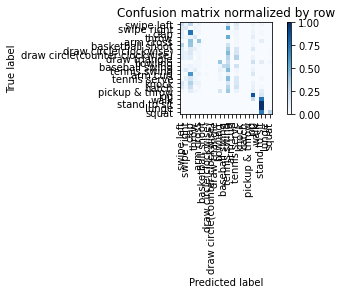

Overall accuracy: 0.209



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

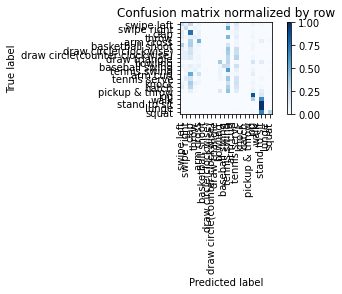

Overall accuracy: 0.221



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

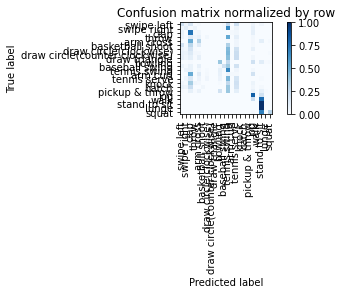

Overall accuracy: 0.207



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

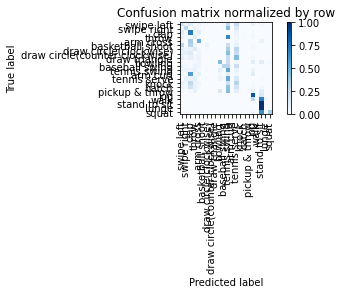

Overall accuracy: 0.227



train:   0%|          | 0/207 [00:00<?, ?batch/s]

seen:   0%|          | 0/51 [00:00<?, ?batch/s]

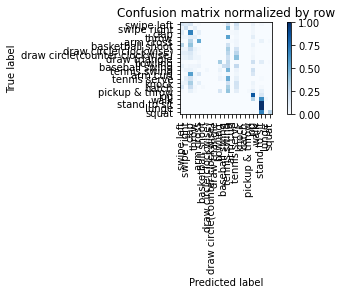

Overall accuracy: 0.208



unseen:   0%|          | 0/50 [00:00<?, ?batch/s]

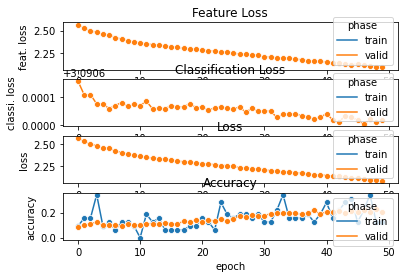

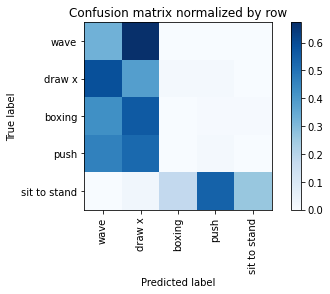

Overall accuracy: 0.194

{'accuracy': 0.194375, 'precision': 0.2717009655454913, 'recall': 0.19655913490481353, 'f1': 0.18100491914684738, 'samples': 1600, 'loss': 3383.1577377319336, 'feat. loss': 3382.9005966186523, 'classi. loss': 2572.3636360168457}
================ Fold-3 ================
Unseen Classes : ['clap', 'draw circle(clockwise)', 'baseball swing', 'knock', 'stand to sit']
data shape : (861,), seen_data shape : (701,)
{'swipe left': 32, 'swipe right': 32, 'wave': 32, 'clap': 32, 'throw': 32, 'arm cross': 32, 'basketball shoot': 32, 'draw x': 31, 'draw circle(clockwise)': 32, 'draw circle(counter clockwise)': 32, 'draw triangle': 32, 'bowling': 32, 'boxing': 32, 'baseball swing': 32, 'tennis swing': 32, 'arm curl': 32, 'tennis serve': 32, 'push': 32, 'knock': 32, 'catch': 32, 'pickup & throw': 32, 'jog': 32, 'walk': 31, 'sit to stand': 32, 'stand to sit': 32, 'lunge': 32, 'squat': 31}
(8077, 12)
seen classes >  [0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 2

Training Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

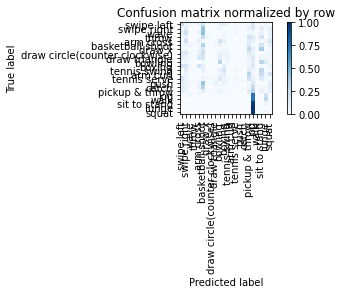

Overall accuracy: 0.092



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

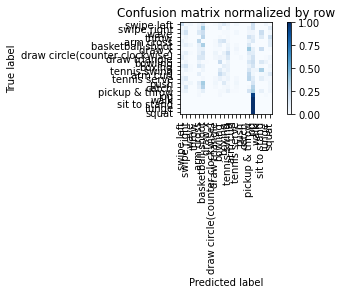

Overall accuracy: 0.116



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

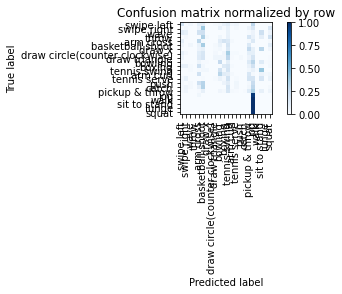

Overall accuracy: 0.118



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

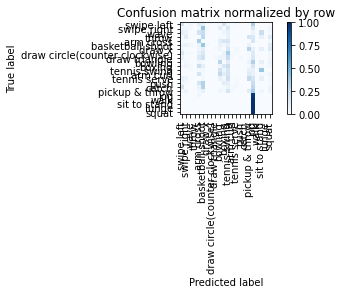

Overall accuracy: 0.122



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

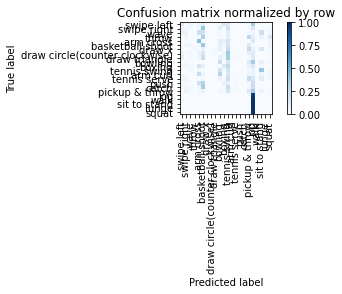

Overall accuracy: 0.120



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

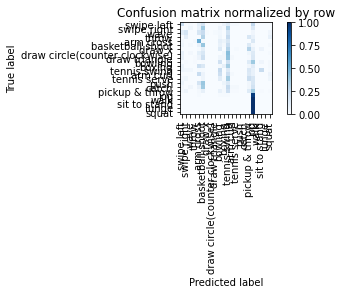

Overall accuracy: 0.117



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

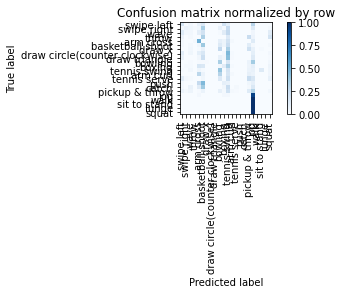

Overall accuracy: 0.128



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

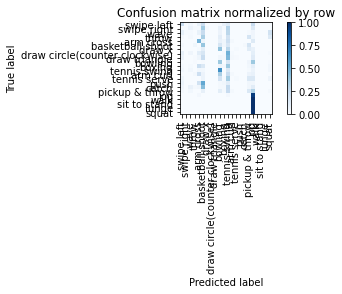

Overall accuracy: 0.128



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

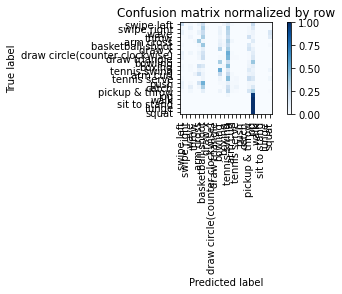

Overall accuracy: 0.127



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

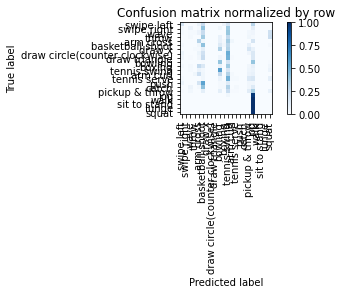

Overall accuracy: 0.121



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

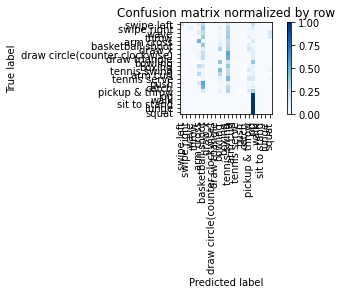

Overall accuracy: 0.131



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

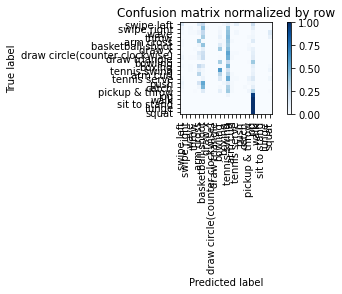

Overall accuracy: 0.117



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

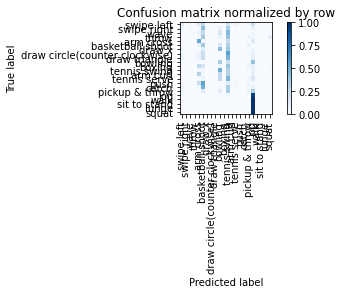

Overall accuracy: 0.121



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

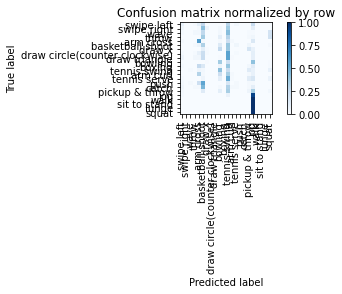

Overall accuracy: 0.117



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

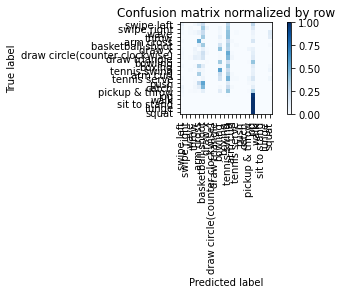

Overall accuracy: 0.119



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

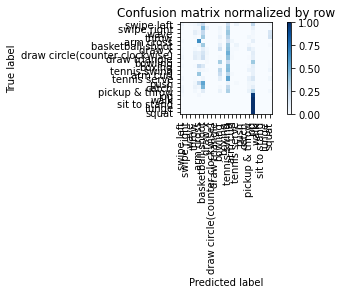

Overall accuracy: 0.133



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

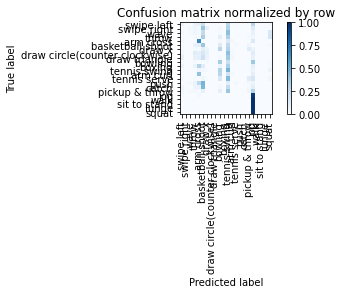

Overall accuracy: 0.137



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

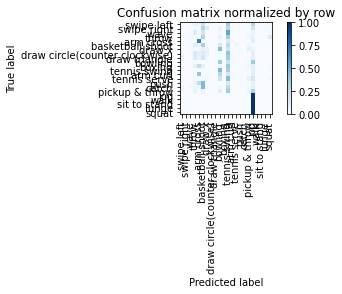

Overall accuracy: 0.129



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

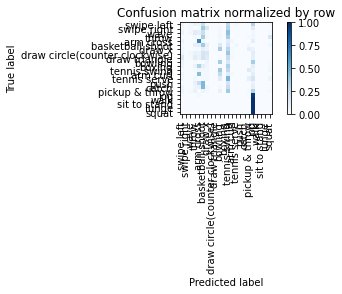

Overall accuracy: 0.126



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

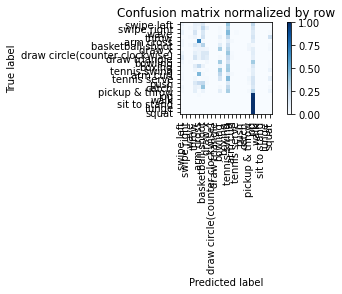

Overall accuracy: 0.129



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

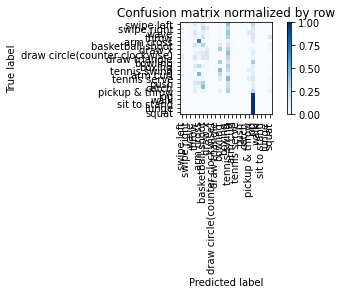

Overall accuracy: 0.126



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

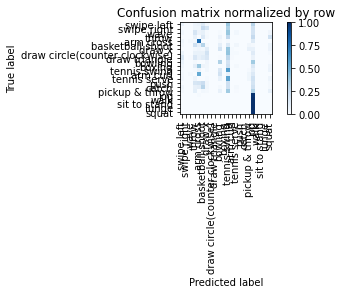

Overall accuracy: 0.141



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

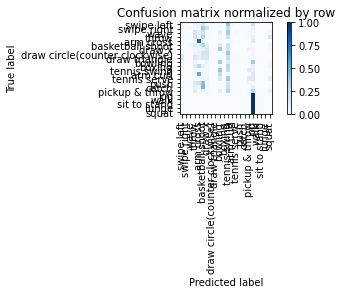

Overall accuracy: 0.136



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

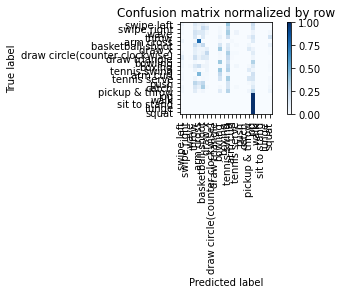

Overall accuracy: 0.134



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

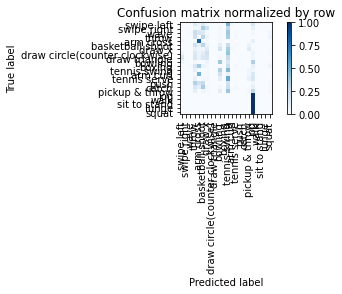

Overall accuracy: 0.144



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

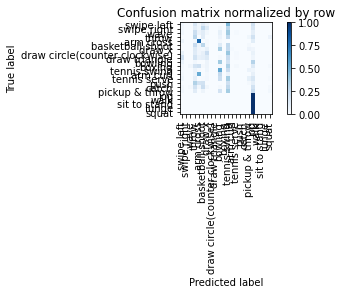

Overall accuracy: 0.134



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

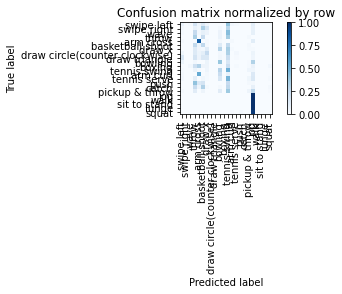

Overall accuracy: 0.153



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

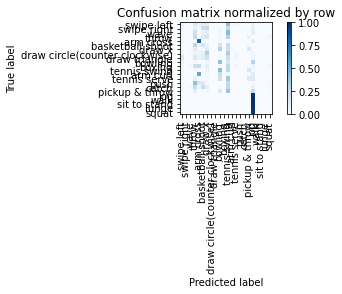

Overall accuracy: 0.141



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

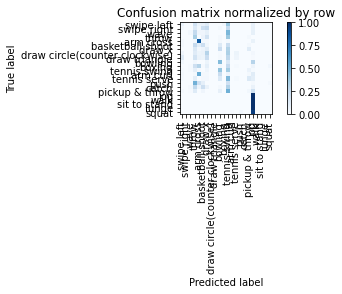

Overall accuracy: 0.152



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

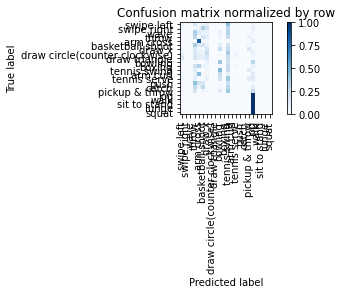

Overall accuracy: 0.138



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

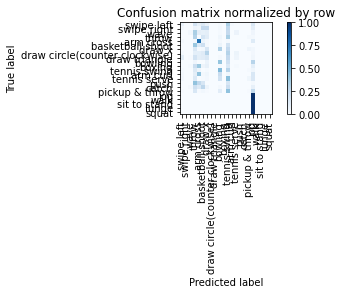

Overall accuracy: 0.141



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

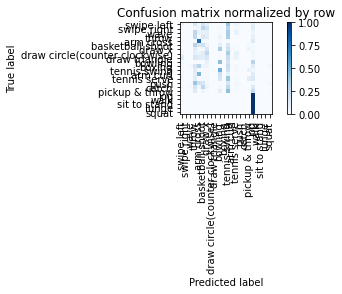

Overall accuracy: 0.138



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

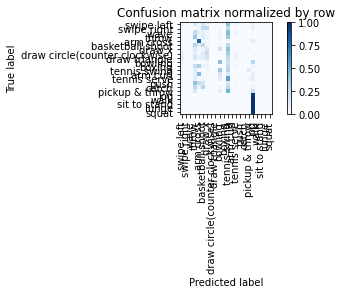

Overall accuracy: 0.147



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

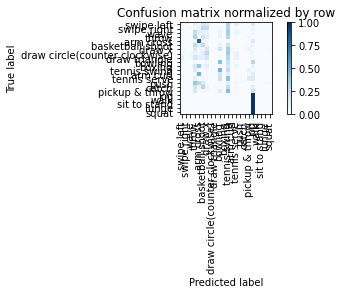

Overall accuracy: 0.144



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

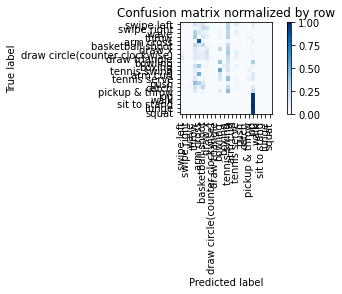

Overall accuracy: 0.145



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

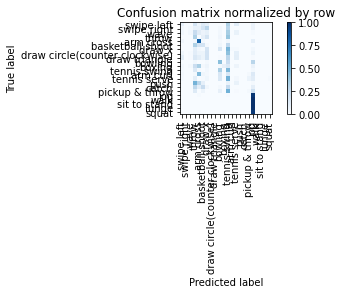

Overall accuracy: 0.156



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

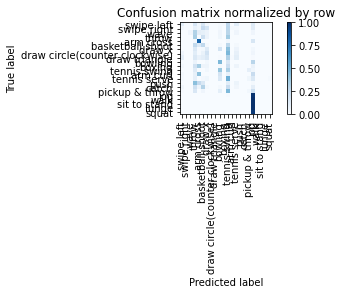

Overall accuracy: 0.154



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

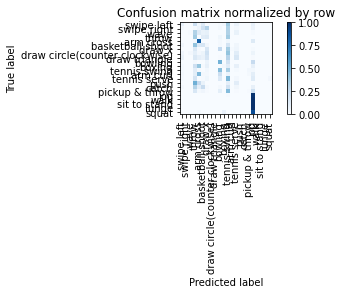

Overall accuracy: 0.152



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

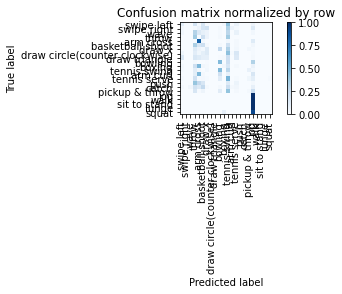

Overall accuracy: 0.151



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

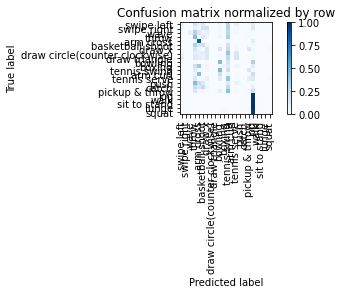

Overall accuracy: 0.154



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

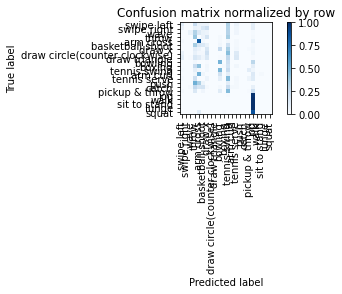

Overall accuracy: 0.152



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

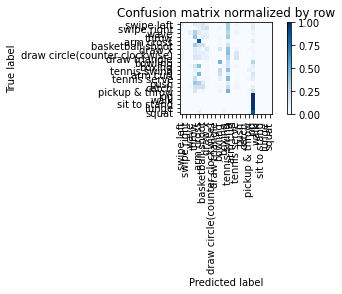

Overall accuracy: 0.163



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

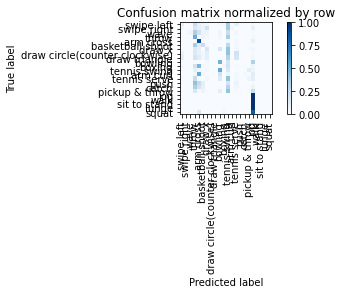

Overall accuracy: 0.155



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

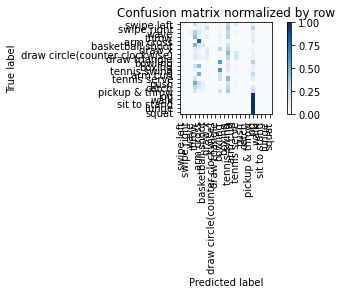

Overall accuracy: 0.151



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

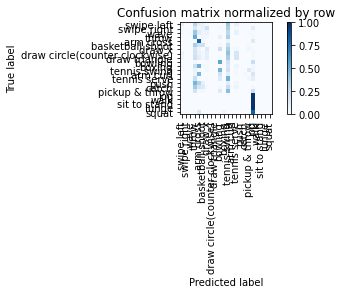

Overall accuracy: 0.152



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

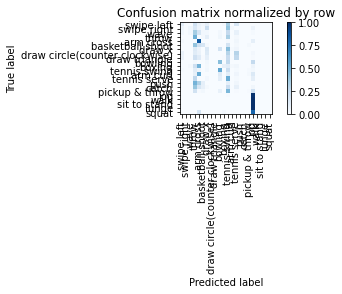

Overall accuracy: 0.152



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

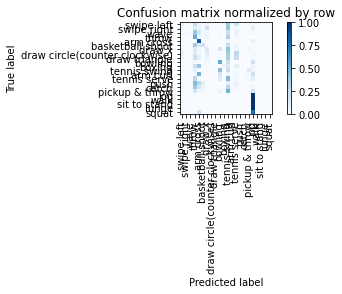

Overall accuracy: 0.158



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

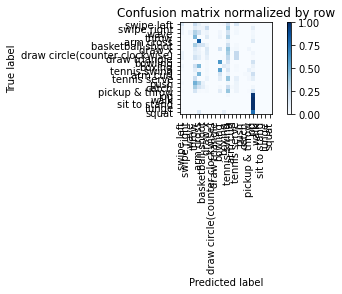

Overall accuracy: 0.168



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

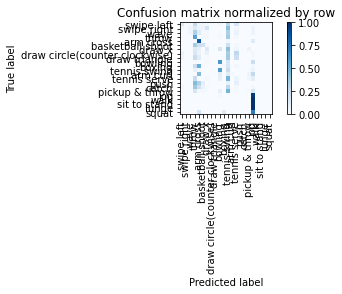

Overall accuracy: 0.168



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

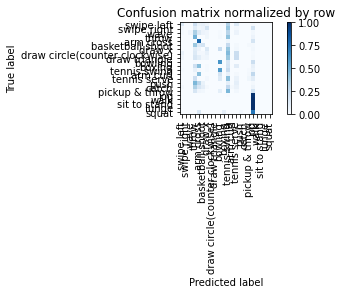

Overall accuracy: 0.162



unseen:   0%|          | 0/57 [00:00<?, ?batch/s]

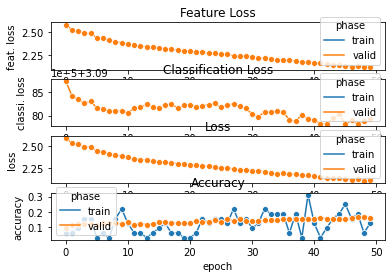

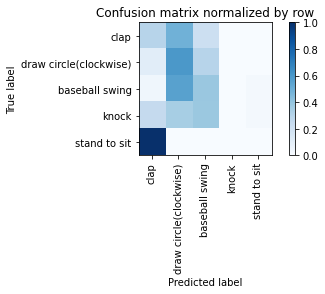

Overall accuracy: 0.278

{'accuracy': 0.2779605263157895, 'precision': 0.16572757335436256, 'recall': 0.2553454465423905, 'f1': 0.1987239763131521, 'samples': 1824, 'loss': 3831.881362915039, 'feat. loss': 3831.587776184082, 'classi. loss': 2935.608127593994}
================ Fold-4 ================
Unseen Classes : ['throw', 'draw circle(counter clockwise)', 'tennis swing', 'catch', 'lunge']
data shape : (861,), seen_data shape : (701,)
{'swipe left': 32, 'swipe right': 32, 'wave': 32, 'clap': 32, 'throw': 32, 'arm cross': 32, 'basketball shoot': 32, 'draw x': 31, 'draw circle(clockwise)': 32, 'draw circle(counter clockwise)': 32, 'draw triangle': 32, 'bowling': 32, 'boxing': 32, 'baseball swing': 32, 'tennis swing': 32, 'arm curl': 32, 'tennis serve': 32, 'push': 32, 'knock': 32, 'catch': 32, 'pickup & throw': 32, 'jog': 32, 'walk': 31, 'sit to stand': 32, 'stand to sit': 32, 'lunge': 32, 'squat': 31}
(8043, 12)
seen classes >  [0, 1, 2, 3, 5, 6, 7, 8, 10, 11, 12, 13, 15, 16, 17, 18,

Training Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

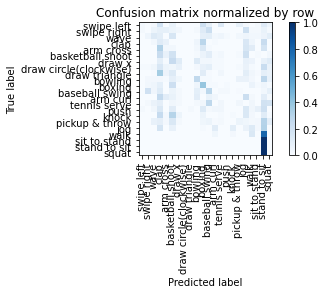

Overall accuracy: 0.125



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

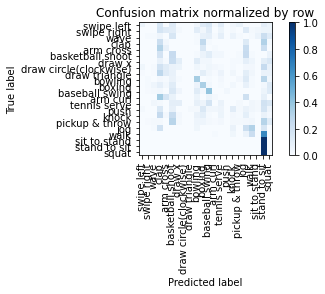

Overall accuracy: 0.150



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

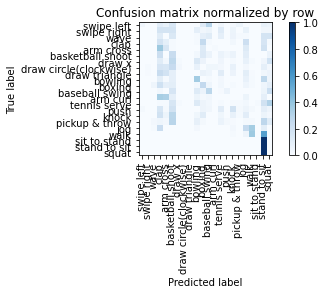

Overall accuracy: 0.144



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

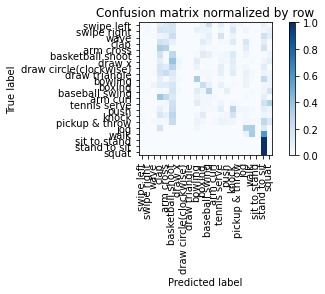

Overall accuracy: 0.163



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

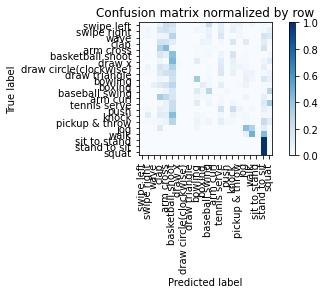

Overall accuracy: 0.171



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

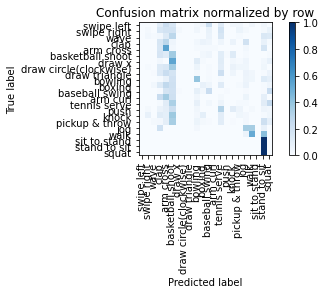

Overall accuracy: 0.164



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

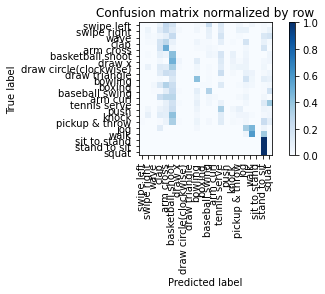

Overall accuracy: 0.177



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

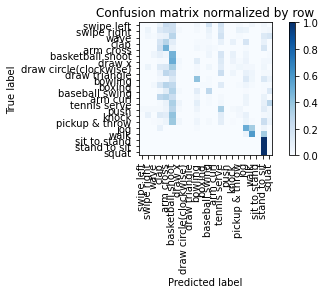

Overall accuracy: 0.179



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

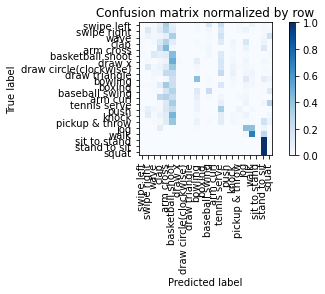

Overall accuracy: 0.181



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

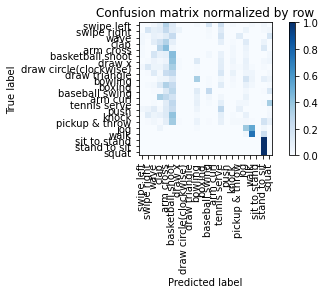

Overall accuracy: 0.182



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

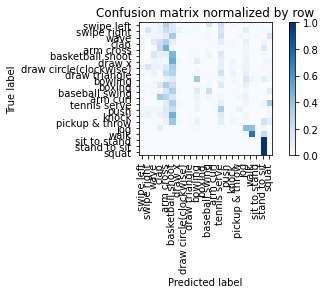

Overall accuracy: 0.187



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

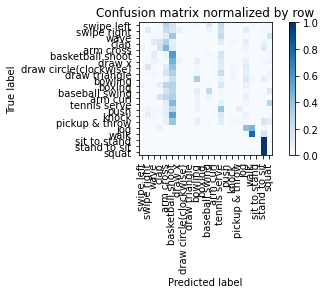

Overall accuracy: 0.194



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

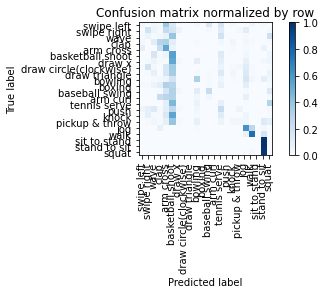

Overall accuracy: 0.209



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

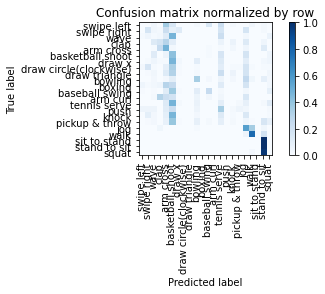

Overall accuracy: 0.193



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

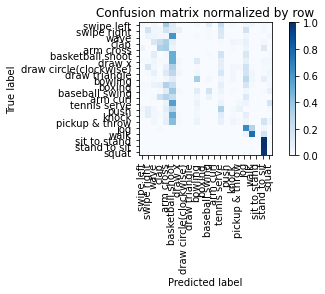

Overall accuracy: 0.196



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

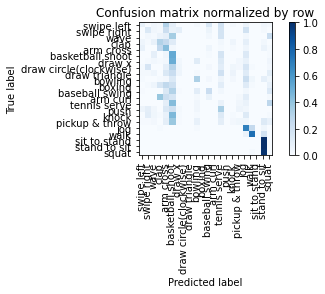

Overall accuracy: 0.206



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

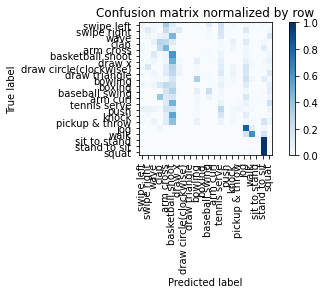

Overall accuracy: 0.206



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

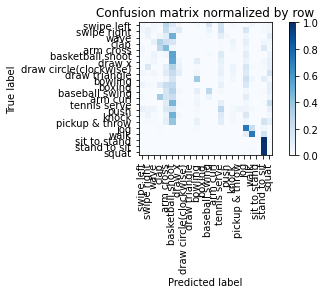

Overall accuracy: 0.206



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

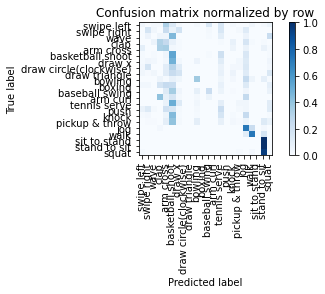

Overall accuracy: 0.204



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

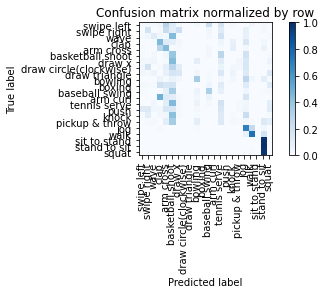

Overall accuracy: 0.220



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

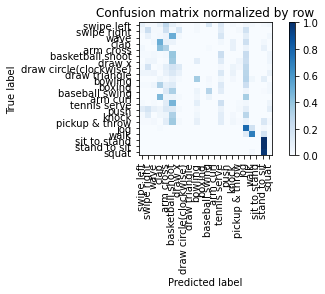

Overall accuracy: 0.219



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

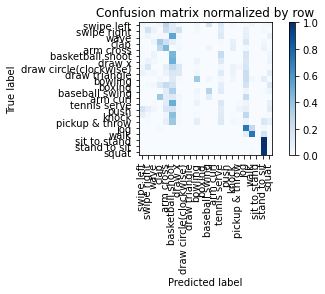

Overall accuracy: 0.215



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

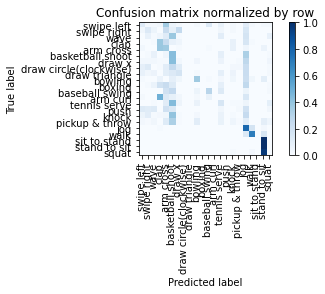

Overall accuracy: 0.214



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

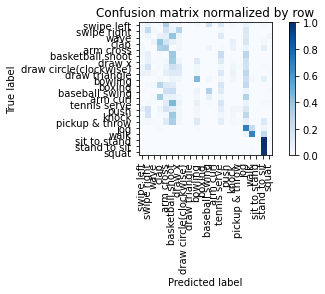

Overall accuracy: 0.213



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

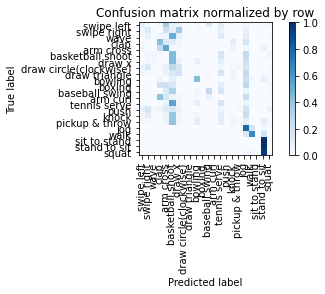

Overall accuracy: 0.223



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

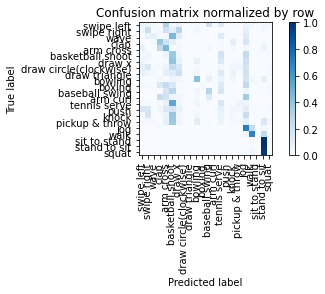

Overall accuracy: 0.221



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

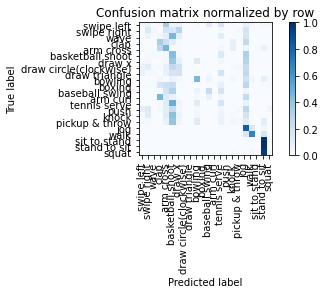

Overall accuracy: 0.218



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

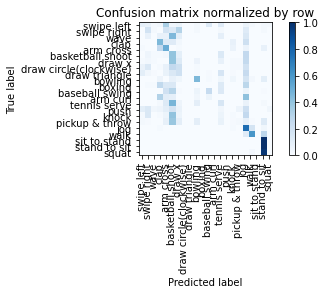

Overall accuracy: 0.223



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

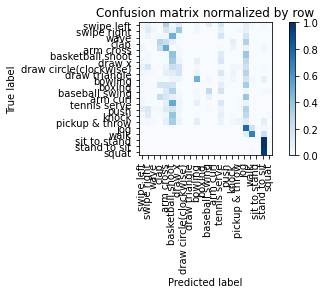

Overall accuracy: 0.218



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

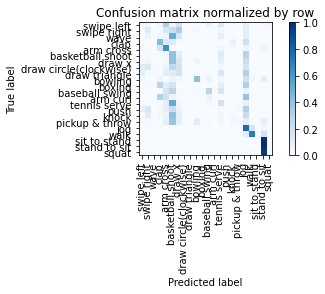

Overall accuracy: 0.231



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

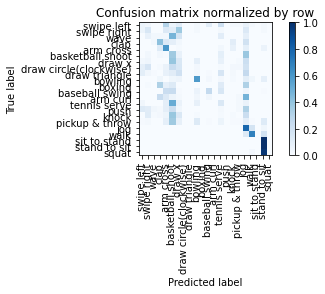

Overall accuracy: 0.234



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

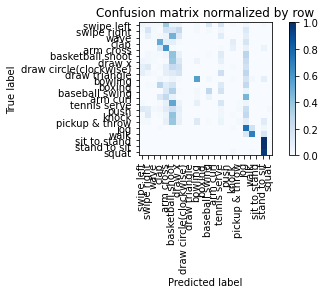

Overall accuracy: 0.239



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

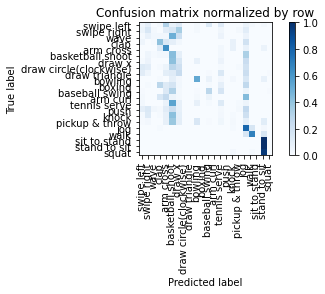

Overall accuracy: 0.234



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

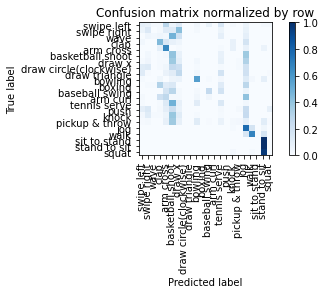

Overall accuracy: 0.236



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

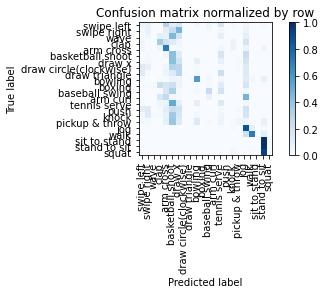

Overall accuracy: 0.241



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

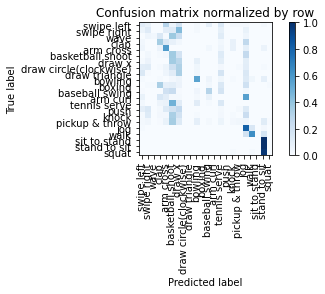

Overall accuracy: 0.239



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

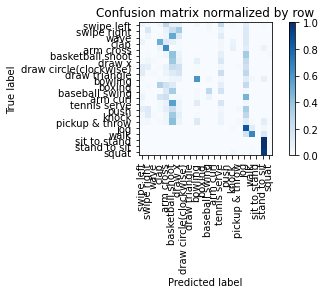

Overall accuracy: 0.242



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

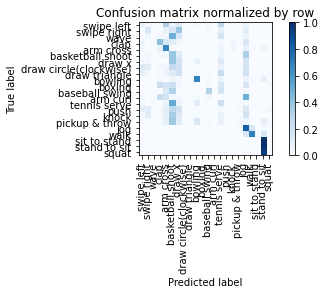

Overall accuracy: 0.251



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

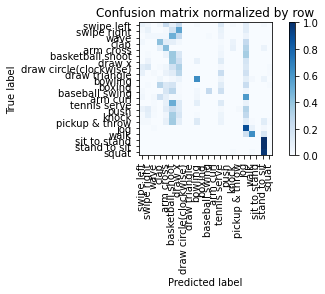

Overall accuracy: 0.231



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

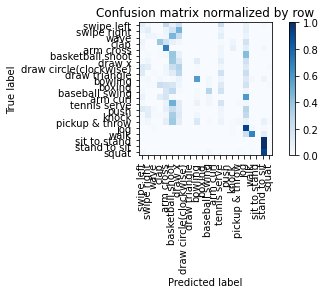

Overall accuracy: 0.249



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

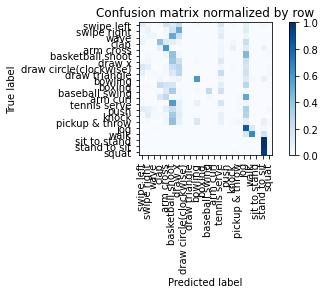

Overall accuracy: 0.241



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

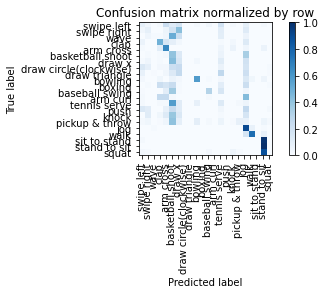

Overall accuracy: 0.256



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

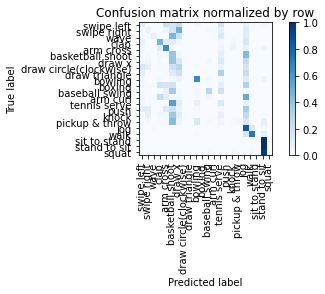

Overall accuracy: 0.248



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

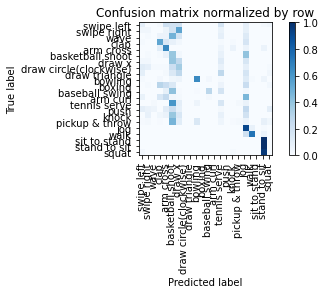

Overall accuracy: 0.258



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

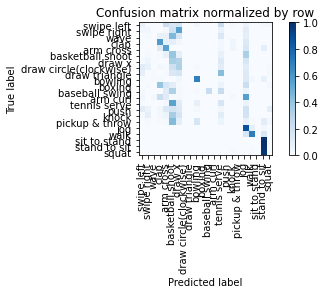

Overall accuracy: 0.251



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

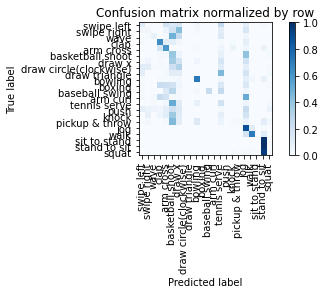

Overall accuracy: 0.260



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

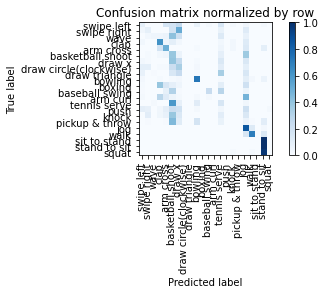

Overall accuracy: 0.253



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

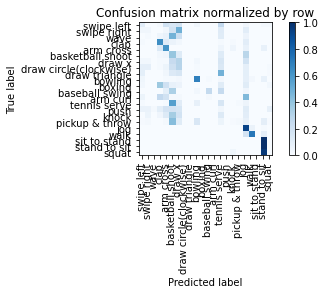

Overall accuracy: 0.264



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

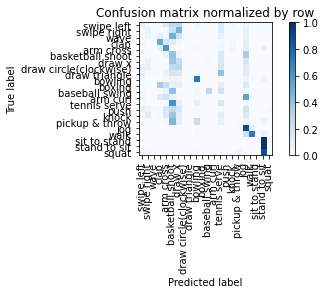

Overall accuracy: 0.254



train:   0%|          | 0/201 [00:00<?, ?batch/s]

seen:   0%|          | 0/50 [00:00<?, ?batch/s]

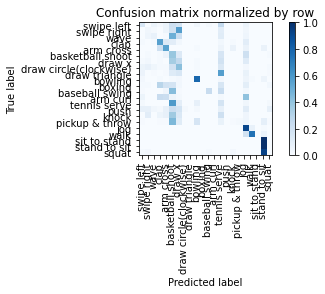

Overall accuracy: 0.264



unseen:   0%|          | 0/58 [00:00<?, ?batch/s]

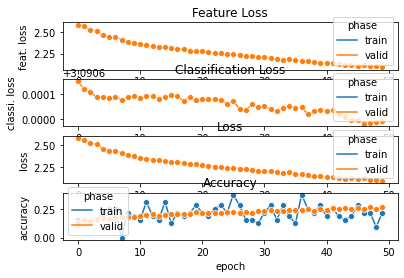

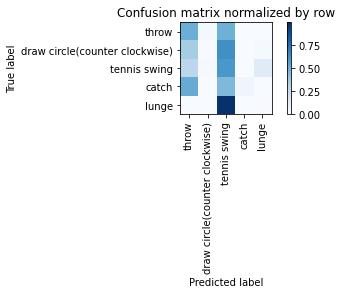

Overall accuracy: 0.199

{'accuracy': 0.19881465517241378, 'precision': 0.3491140375834926, 'recall': 0.2287452946357495, 'f1': 0.14262673966668143, 'samples': 1856, 'loss': 4021.089324951172, 'feat. loss': 4020.7906341552734, 'classi. loss': 2986.2785835266113}
============== Overall Unseen Classes Performance ==============


accuracy           0.248258
precision          0.252596
recall             0.252825
f1                 0.192987
samples         1971.200000
loss            4200.378928
feat. loss      4200.045135
classi. loss    3338.375296
dtype: float64

In [ ]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=1.2, window_overlap=1.0, resample_freq=50)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    model.to(device)

    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'], weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(reduction="sum"), 'feature': nn.L1Loss(reduction="sum")}
    best_acc = 0.0

    # train the model 
    train_data = []
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
    
        train_metrics = train_step(model, train_dl, train_dt,optimizer, loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        train_metrics['epoch'] = epoch
        train_metrics['phase'] = 'train'
        train_data.append(train_metrics)

        eval_metrics = eval_step(model, eval_dl, eval_dt,loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='seen', loss_alpha=0.0001, print_report=False)
        eval_metrics['epoch'] = epoch 
        eval_metrics['phase'] = 'valid'
        train_data.append(eval_metrics)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())
    
    train_df = pd.DataFrame().from_records(train_data)
    plot_curves(train_df)

    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model,notebook_iden,model_iden,i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl,test_dt, loss_module, device, class_names=[all_classes[i] for i in unseen_classes], phase='unseen', loss_alpha=0.0001, print_report=False)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
